<a href="https://colab.research.google.com/github/Erencode27/AI_Engineering_Projects/blob/main/ibm_ai_eng_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.0/19.0 MB 107.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.0
    Uninstalling numpy-2.2.0:
      Successfully uninstalled numpy-2.2.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inequality 1.1.2 requires pandas>=2.1, which is not installed.
pysal 25.7 requires pandas>=1.4, which is not installed.
pymc 5.26.1 requires pandas>=0.24.0, which is not installed.
mizani 0.13.5 requires pandas>=2.2.0, which is not installed.
seaborn 0.13.2 requires pandas>=1.2, which is not installed.
dask-cuda 25.10.0 requires pandas>=1.3, which is not installed.
cmdstanpy 1.3.0 requires pandas, which is not installed.
plotnine 0.14.5 requires pandas>=2.2.0, which is not installed.
geemap 0.35.3 requires panda

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler

import umap.umap_ as UMAP
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

import plotly.express as px
from sklearn.datasets import make_blobs

In [ ]:
# CLuster centers:
centers = [ [ 2, -6, -6],
            [-1,  9,  4],
            [-8,  7,  2],
            [ 4,  7,  9] ]

# Cluster standard deviations:
cluster_std=[1,1,2,3.5]

# Make the blobs and return the data and the blob labels
X, labels_ = make_blobs(n_samples=500, centers=centers, n_features=3, cluster_std=cluster_std, random_state=42)

In [ ]:
# Create a DataFrame for Plotly
df = pd.DataFrame(X, columns=['X', 'Y', 'Z'])

# Create interactive 3D scatter plot
fig = px.scatter_3d(df, x='X', y='Y', z='Z', color=labels_.astype(str) ,  opacity=0.7,  color_discrete_sequence=px.colors.qualitative.G10, title="3D Scatter Plot of Four Blobs")

fig.update_traces(marker=dict(size=5, line=dict(width=1, color='black')), showlegend=False)
fig.update_layout(coloraxis_showscale=False, width=1000, height=800)  # Remove color bar, resize plot

fig.show()

In [ ]:
# Enter your code here:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
tsne = TSNE(n_components=2,random_state=42,perplexity=30,max_iter=1000)
X_tsne = tsne.fit_transform(X_scaled)

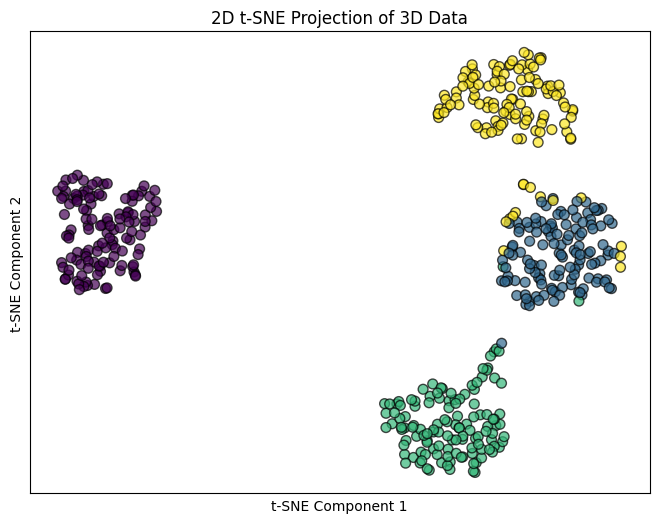

In [ ]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.scatter(X_tsne[:,0],X_tsne[:,1],c=labels_,cmap='viridis',s=50,alpha=0.7,edgecolor='k')
ax.set_title("2D t-SNE Projection of 3D Data")
ax.set_xlabel("t-SNE Component 1")
ax.set_ylabel("t-SNE Component 2")
ax.set_xticks([])
ax.set_yticks([])
plt.show()

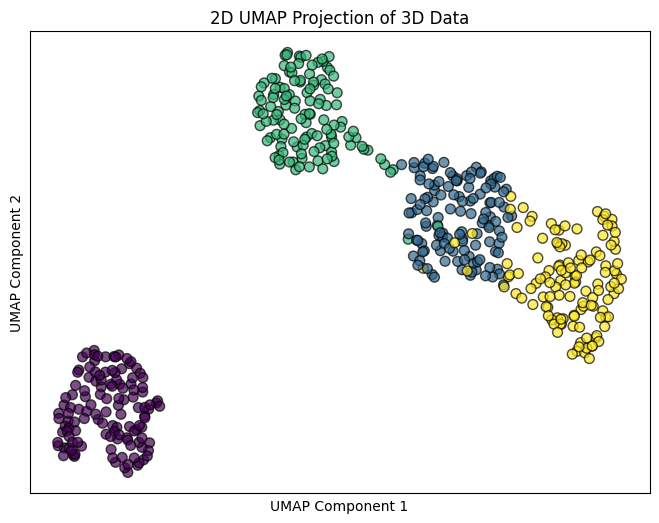

In [ ]:
umap_model = UMAP.UMAP(n_components=2,random_state=42,min_dist=0.5,spread=1,n_jobs=1)
X_umap = umap_model.fit_transform(X_scaled)

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.scatter(X_umap[:,0],X_umap[:,1],c=labels_,cmap='viridis',s=50,alpha=0.7,edgecolor='k')
ax.set_title("2D UMAP Projection of 3D Data")
ax.set_xlabel("UMAP Component 1", )
ax.set_ylabel("UMAP Component 2", )
ax.set_xticks([])
ax.set_yticks([])
plt.show()

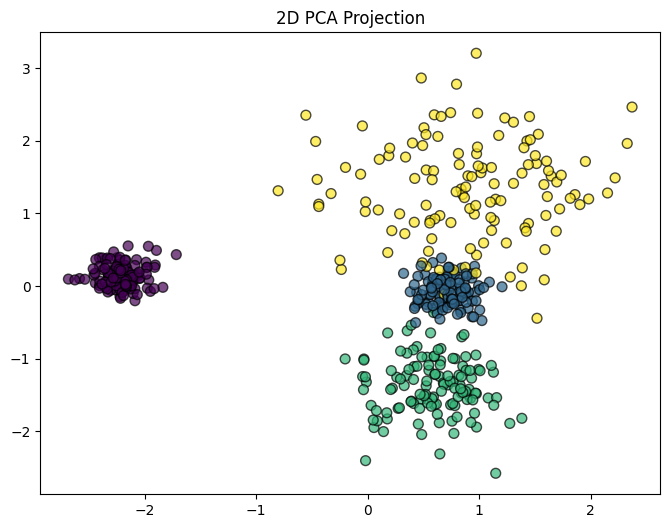

In [ ]:
pca = PCA(n_components=2,random_state=42)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
ax2 =fig.add_subplot(111)
scatter2= plt.scatter(X_pca[:,0],X_pca[:,1],c=labels_,cmap='viridis',s=50,alpha=0.7,edgecolor='k')
ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
plt.title("2D PCA Projection")
plt.show()

In [ ]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris
from sklearn.datasets import load_breast_cancer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data = load_breast_cancer()
X, y = data.data, data.target
labels = data.target_names
feature_names = data.feature_names

In [ ]:
print(data.DESCR)

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

:Number of Instances: 569

:Number of Attributes: 30 numeric, predictive attributes and the class

:Attribute Information:
    - radius (mean of distances from center to points on the perimeter)
    - texture (standard deviation of gray-scale values)
    - perimeter
    - area
    - smoothness (local variation in radius lengths)
    - compactness (perimeter^2 / area - 1.0)
    - concavity (severity of concave portions of the contour)
    - concave points (number of concave portions of the contour)
    - symmetry
    - fractal dimension ("coastline approximation" - 1)

    The mean, standard error, and "worst" or largest (mean of the three
    worst/largest values) of these features were computed for each image,
    resulting in 30 features.  For instance, field 0 is Mean Radius, field
    10 is Radius SE, field 20 is Worst Radius.

    - 

In [ ]:
print(data.target_names)

['malignant' 'benign']


In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
np.random.seed(42)
noise_factor = 0.5
X_noisy = X_scaled + noise_factor* np.random.normal(loc=0.0,scale=1.0,size=X_scaled.shape)

df = pd.DataFrame(X_scaled,columns=feature_names)
df_noisy = pd.DataFrame(X_noisy,columns=feature_names)

In [ ]:
print("Original Data (First 5 rows):")
df.head()

Original Data (First 5 rows):


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100


In [ ]:
print("\nNoisy Data (First 5 rows):")
df_noisy.head()


Noisy Data (First 5 rows):


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,1.345421,-2.142467,1.593778,1.745890,1.451390,3.166446,3.442480,2.916193,1.982778,2.527027,...,2.619514,-1.472182,2.337365,1.288863,1.035495,2.672126,1.534030,2.483925,2.450303,1.791168
1,1.528967,0.572507,1.679206,1.379853,-0.415690,-1.097493,0.080586,-0.431691,-0.662701,-0.770222,...,1.967969,-0.561744,1.196665,2.196327,0.139888,0.035196,-0.566358,0.932478,-0.078258,0.768963
2,1.340301,0.363357,1.013336,0.960780,1.348473,1.731046,1.327473,2.538997,1.120503,-0.720568,...,1.402034,0.154582,2.086422,1.197149,0.123161,0.832054,1.312675,2.119376,0.887375,0.458025
3,-0.720371,0.738055,-0.943714,-0.928295,3.087499,2.671152,2.063957,1.582235,2.869940,4.793626,...,-1.240850,0.120727,-0.219824,0.681600,3.298094,4.044171,1.972232,1.591447,6.617453,5.310977
4,2.145813,-1.606510,2.477970,1.125304,0.573800,1.634568,0.875743,1.145344,0.040265,-0.814188,...,1.412305,-0.813199,0.534798,1.313041,0.350498,0.077517,-0.005297,0.069031,-0.607382,-0.248607


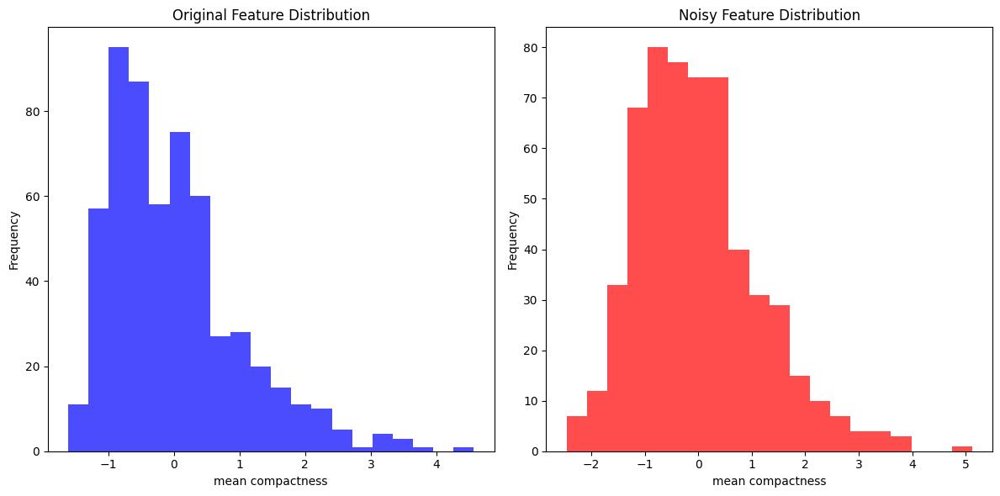

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.hist(df[feature_names[5]],bins=20,alpha=0.7,color='blue',label='original')
plt.title('Original Feature Distribution')
plt.xlabel(feature_names[5])
plt.ylabel('Frequency')
plt.subplot(1,2,2)
plt.hist(df_noisy[feature_names[5]], bins=20, alpha=0.7, color='red', label='Noisy')
plt.title('Noisy Feature Distribution')
plt.xlabel(feature_names[5])
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

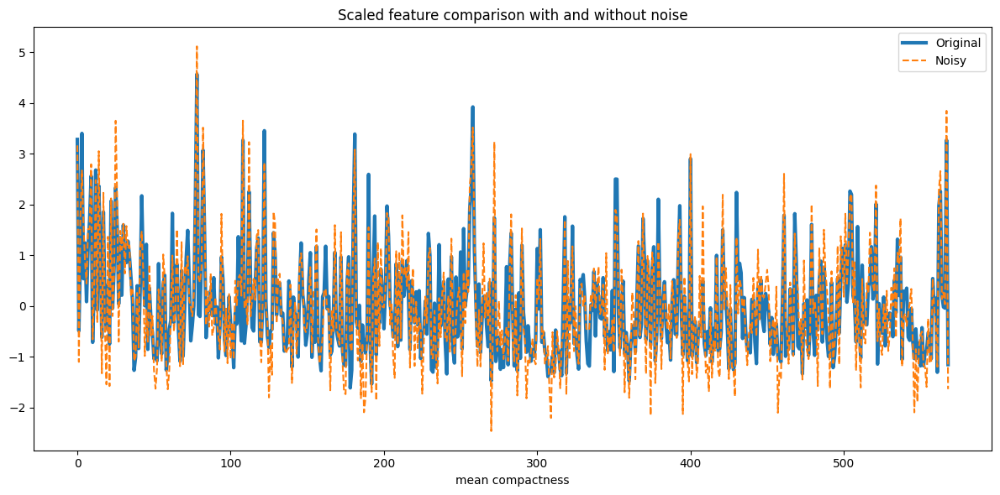

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(df[feature_names[5]], label='Original',lw=3)
plt.plot(df_noisy[feature_names[5]], '--',label='Noisy',)
plt.title('Scaled feature comparison with and without noise')
plt.xlabel(feature_names[5])
plt.legend()
plt.tight_layout()
plt.show()

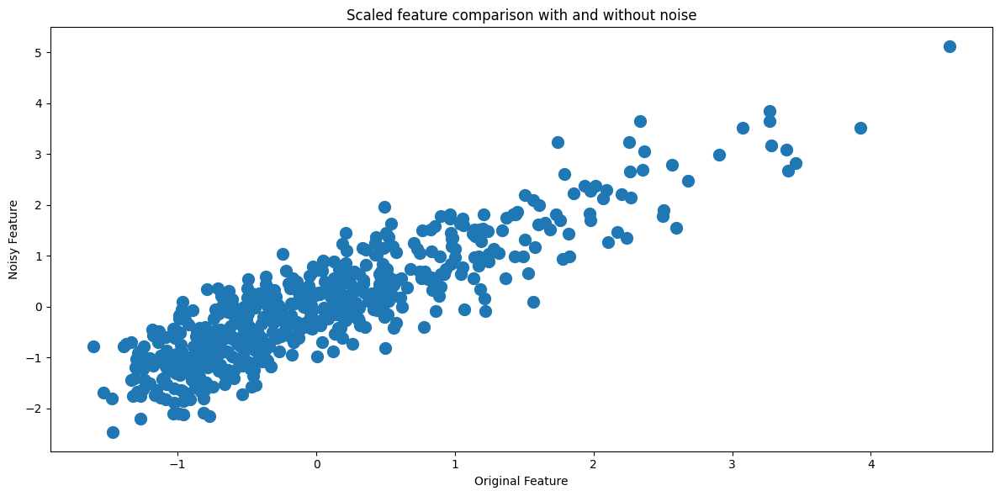

In [ ]:
plt.figure(figsize=(12,6))
plt.scatter(df[feature_names[5]],df_noisy[feature_names[5]],lw=5)
plt.title('Scaled feature comparison with and without noise')
plt.xlabel('Original Feature')
plt.ylabel('Noisy Feature')
plt.tight_layout()
plt.show()

In [ ]:
X_train,X_test, y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

knn = KNeighborsClassifier(n_neighbors=5)
svm = SVC(kernel='linear',C=1,random_state=42)

knn.fit(X_train,y_train)
svm.fit(X_train,y_train)


SVC(C=1, kernel='linear', random_state=42)

In [ ]:
y_pred_knn = knn.predict(X_test)
y_pred_svm = svm.predict(X_test)

In [ ]:
print(f"KNN Testing Accuracy: {accuracy_score(y_test, y_pred_knn):.3f}")
print(f"SVM Testing Accuracy: {accuracy_score(y_test, y_pred_svm):.3f}")

print("\nKNN Testing Data Classification Report:")
print(classification_report(y_test, y_pred_knn))

print("\nSVM Testing Data Classification Report:")
print(classification_report(y_test, y_pred_svm))

KNN Testing Accuracy: 0.956
SVM Testing Accuracy: 0.956

KNN Testing Data Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.88      0.94        43
           1       0.93      1.00      0.97        71

    accuracy                           0.96       114
   macro avg       0.97      0.94      0.95       114
weighted avg       0.96      0.96      0.96       114


SVM Testing Data Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.91      0.94        43
           1       0.95      0.99      0.97        71

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



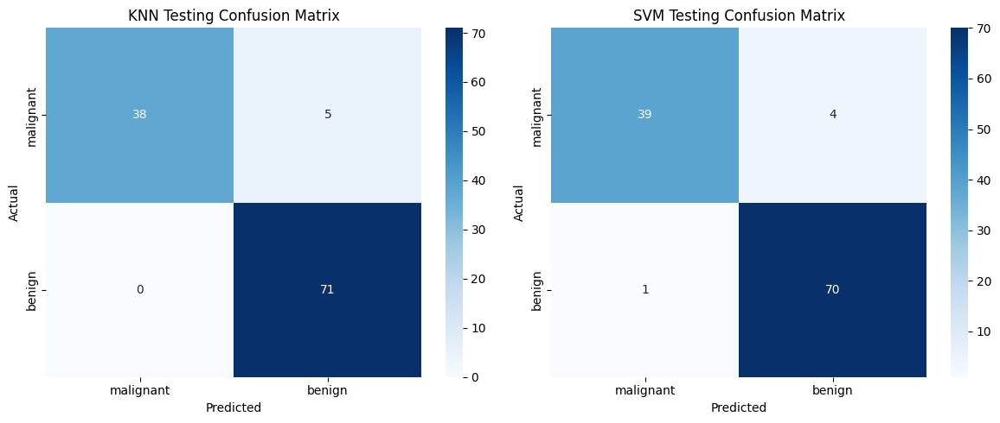

In [ ]:
conf_matrix_knn = confusion_matrix(y_test,y_pred_knn)
conf_matrix_svm= confusion_matrix(y_test,y_pred_svm)
fig, axes = plt.subplots(1,2,figsize=(12,5))
sns.heatmap(conf_matrix_knn,annot=True,cmap='Blues',fmt='d',ax=axes[0],xticklabels=labels,yticklabels=labels)
axes[0].set_title('KNN Testing Confusion Matrix')
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('Actual')

sns.heatmap(conf_matrix_svm,annot=True,cmap='Blues',fmt='d',ax=axes[1],xticklabels=labels,yticklabels=labels)
axes[1].set_title('SVM Testing Confusion Matrix')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('Actual')

plt.tight_layout()
plt.show()

In [ ]:
y_pred_train_knn = knn.predict(X_train)
y_pred_train_svm = svm.predict(X_train)


In [ ]:
# Evaluate the models on the training data
print(f"KNN Training Accuracy: {accuracy_score(y_train, y_pred_train_knn):.3f}")
print(f"SVM Training Accuracy: {accuracy_score(y_train, y_pred_train_svm):.3f}")

print("\nKNN Training Classification Report:")
print(classification_report(y_train, y_pred_train_knn))

print("\nSVM Training Classification Report:")
print(classification_report(y_train, y_pred_train_svm))

KNN Training Accuracy: 0.941
SVM Training Accuracy: 0.969

KNN Training Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.87      0.92       169
           1       0.93      0.98      0.95       286

    accuracy                           0.94       455
   macro avg       0.95      0.93      0.94       455
weighted avg       0.94      0.94      0.94       455


SVM Training Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.94      0.96       169
           1       0.97      0.99      0.98       286

    accuracy                           0.97       455
   macro avg       0.97      0.96      0.97       455
weighted avg       0.97      0.97      0.97       455



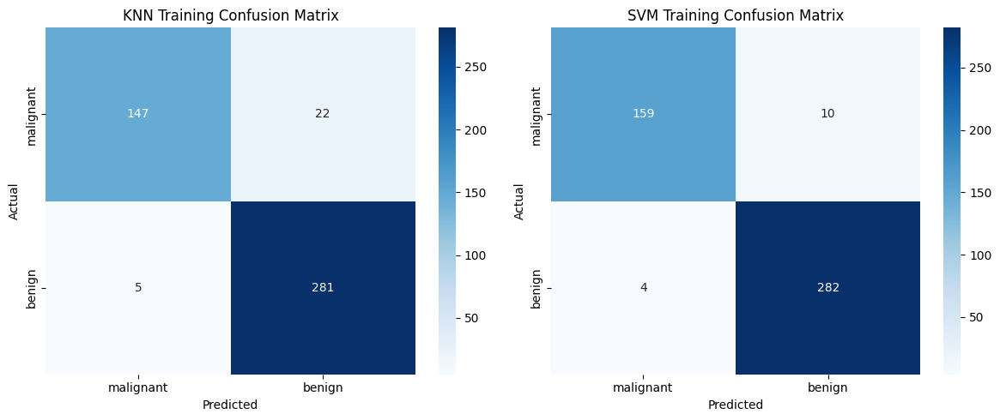

In [ ]:
# Enter your code here
conf_matrix_knn = confusion_matrix(y_train, y_pred_train_knn)
conf_matrix_svm = confusion_matrix(y_train,y_pred_train_svm)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.heatmap(conf_matrix_knn, annot=True, cmap='Blues', fmt='d', ax=axes[0],
            xticklabels=labels, yticklabels=labels)

axes[0].set_title('KNN Training Confusion Matrix')
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('Actual')

sns.heatmap(conf_matrix_svm, annot=True, cmap='Blues', fmt='d', ax=axes[1],
            xticklabels=labels, yticklabels=labels)
axes[1].set_title('SVM Training Confusion Matrix')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('Actual')

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, root_mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import skew

In [ ]:
data = fetch_california_housing()
X, y = data.data, data.target

In [ ]:
print(data.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

:Number of Instances: 20640

:Number of Attributes: 8 numeric, predictive attributes and the target

:Attribute Information:
    - MedInc        median income in block group
    - HouseAge      median house age in block group
    - AveRooms      average number of rooms per household
    - AveBedrms     average number of bedrooms per household
    - Population    block group population
    - AveOccup      average number of household members
    - Latitude      block group latitude
    - Longitude     block group longitude

:Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived from the 1990 U.S. census, using one row per ce

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [ ]:
eda = pd.DataFrame(data=X_train)
eda.columns = data.feature_names
eda['MedHouseVal'] = y_train
eda.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000
mean,3.880754,28.608285,5.435235,1.096685,1426.453004,3.096961,35.643149,-119.582290,2.071947
std,1.904294,12.602499,2.387375,0.433215,1137.056380,11.578744,2.136665,2.005654,1.156226
min,0.499900,1.000000,0.888889,0.333333,3.000000,0.692308,32.550000,-124.350000,0.149990
25%,2.566700,18.000000,4.452055,1.006508,789.000000,2.428799,33.930000,-121.810000,1.198000
50%,3.545800,29.000000,5.235874,1.049286,1167.000000,2.817240,34.260000,-118.510000,1.798500
75%,4.773175,37.000000,6.061037,1.100348,1726.000000,3.280000,37.720000,-118.010000,2.651250
max,15.000100,52.000000,141.909091,25.636364,35682.000000,1243.333333,41.950000,-114.310000,5.000010


Text(0, 0.5, 'Frequency')

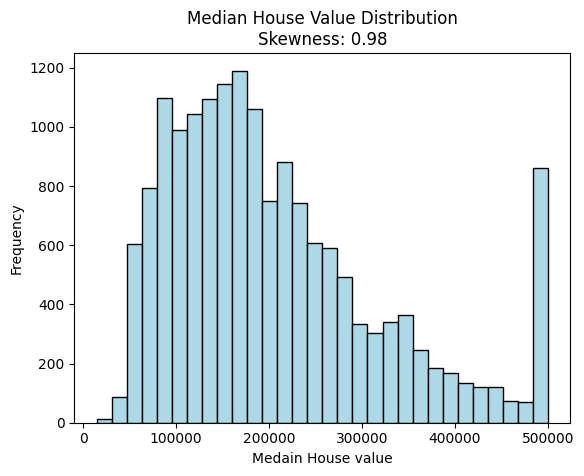

In [ ]:
plt.hist(1e5*y_train,bins=30,color='lightblue',edgecolor='black')
plt.title(f'Median House Value Distribution\nSkewness: {skew(y_train):.2f}')
plt.xlabel("Medain House value")
plt.ylabel("Frequency")

In [ ]:
 rf_regressor =RandomForestRegressor(n_estimators=100,random_state=42)
 rf_regressor.fit(X_train,y_train)

 y_pred_test = rf_regressor.predict(X_test)

In [ ]:
mae = mean_absolute_error(y_test,y_pred_test)
mse = mean_squared_error(y_test,y_pred_test)
rmse= root_mean_squared_error(y_test,y_pred_test)
r2 = r2_score(y_test,y_pred_test)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

Mean Absolute Error (MAE): 0.3275
Mean Squared Error (MSE): 0.2554
Root Mean Squared Error (RMSE): 0.5053
R² Score: 0.8051


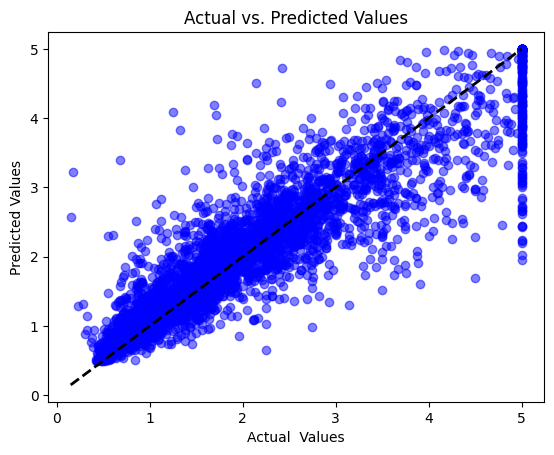

In [ ]:
plt.scatter(y_test,y_pred_test,alpha=0.5,color='blue')
plt.plot([y_test.min(),y_test.max()],[y_test.min(),y_test.max()],"--k",lw=2)
plt.xlabel("Actual  Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Values")
plt.show()


Mean(Average) House Value Error:-1242
House Value Error Standard Deviation:50518


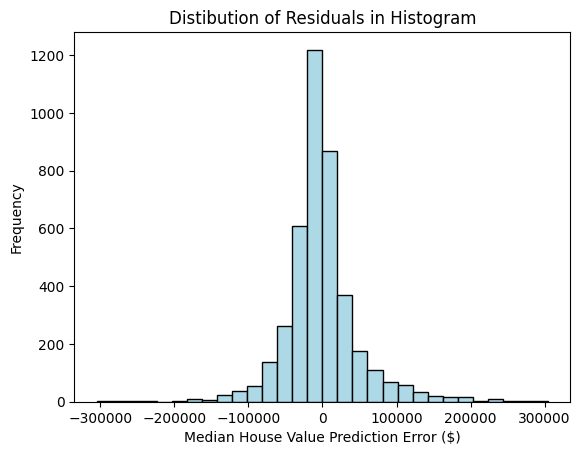

In [ ]:
residuals = 1e5*(y_test-y_pred_test)
plt.hist(residuals,bins=30,color='lightblue',edgecolor='black')
plt.title("Distibution of Residuals in Histogram")
plt.xlabel('Median House Value Prediction Error ($)')
plt.ylabel('Frequency')
print("Mean(Average) House Value Error:"+ str(int(np.mean(residuals))))
print("House Value Error Standard Deviation:"+str(int(np.std(residuals))))


In [ ]:
residuals_df = pd.DataFrame({
    'Actual':1e5*y_test,
    'Residuals': residuals
})

residuals_df

,Actual,Residuals
0,47700.0,-3250.00
1,45800.0,-28361.00
2,500001.0,7675.29
3,218600.0,-34361.00
4,278000.0,50631.00
...,...,...
4123,263300.0,36579.00
4124,266800.0,67435.00
4125,500001.0,24179.13
4126,72300.0,891.00


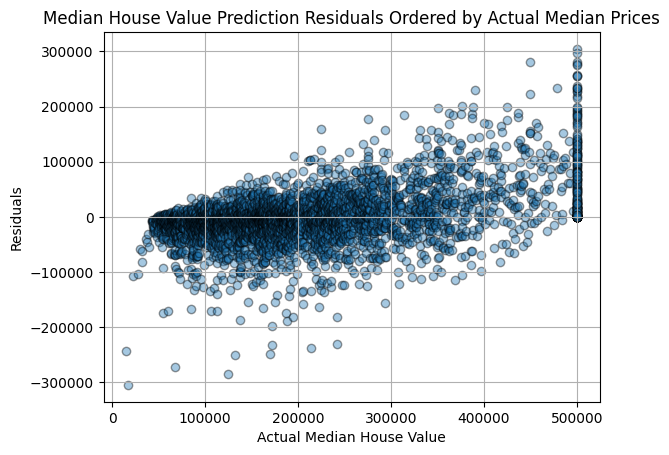

In [ ]:
residuals_df = residuals_df.sort_values(by="Actual")
plt.scatter(residuals_df["Actual"],residuals_df["Residuals"],marker='o',alpha=0.4,ec='k')
plt.title("Median House Value Prediction Residuals Ordered by Actual Median Prices")
plt.xlabel("Actual Median House Value")
plt.ylabel("Residuals")
plt.grid(True)
plt.show()

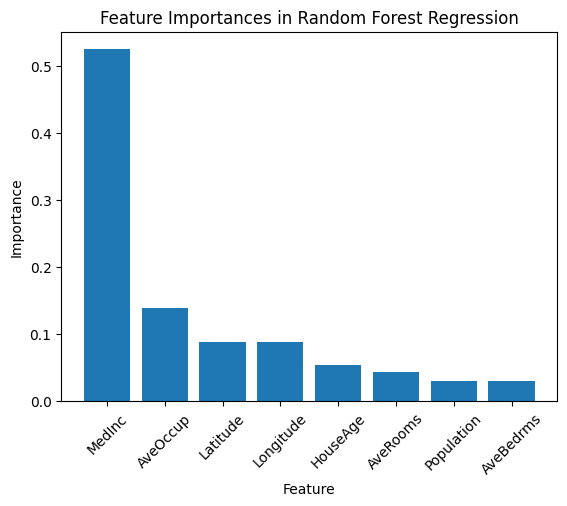

In [ ]:
importances = rf_regressor.feature_importances_
indices = np.argsort(importances)[::-1]
features= data.feature_names

plt.bar(range(X.shape[1]),importances[indices],align='center')
plt.xticks(range(X.shape[1]),[features[i] for i in indices],rotation=45)
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Feature Importances in Random Forest Regression")
plt.show()


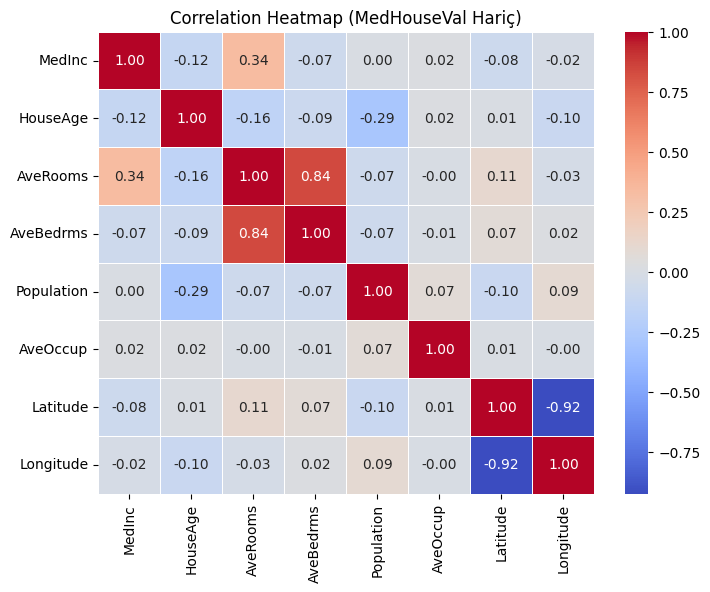

In [ ]:
# Önce sütunu at, sonra kalanların korelasyonunu al
matrix = eda.drop("MedHouseVal", axis=1).corr()

plt.figure(figsize=(8,6))
sns.heatmap(matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap (MedHouseVal Hariç)")
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.datasets import make_classification
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from scipy.spatial import Voronoi, voronoi_plot_2d
from matplotlib.patches import Patch
from matplotlib import cm


In [ ]:
def evaluate_clustering(X,labels,n_clusters,ax=None, title_suffix=''):
  if ax is None:
    ax = plt.gca()
  silhouette_avg = silhouette_score(X,labels)
  sample_silhouette_values = silhouette_samples(X,labels)
  unique_labels = np.unique(labels)
  colormap = cm.tab10
  color_dict = {label:colormap(float(label)/n_clusters) for label in unique_labels}
  y_lower =10
  for i in unique_labels:
    ith_cluster_silhouette_values =sample_silhouette_values[labels == i]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    color = color_dict[i]
    ax.fill_between(np.arange(y_lower,y_upper),0,ith_cluster_silhouette_values,
                    facecolor=color,edgecolor=color,alpha=0.7)
    ax.text(-0.05,y_lower+0.5*size_cluster_i,str(i))
    y_lower = y_upper+10
    ax.set_title(f'Silhouette Score for {title_suffix} \n' +
                 f'Average Silhouette: {silhouette_avg:.2f}')
    ax.set_xlabel('Silhouette Coefficient')
    ax.set_ylabel('Cluster')
    ax.axvline(x=silhouette_avg,color='red',linestyle='--')
    ax.set_xlim([-0.25,1])
    ax.set_yticks([])

In [ ]:
X,y =make_blobs(n_samples =500,n_features=2,centers=4,cluster_std=[1.0,3,5,2],random_state=42)
n_clusters = 4
kmeans= KMeans(n_clusters=n_clusters,random_state=42)
y_kmeans = kmeans.fit_predict(X)

colormap = cm.tab10
plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
plt.scatter(X[:,0],X[:,1],s=50,alpha=0.6,edgecolor='k')
centers= kmeans.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],c='red',s=200,marker='X',alpha=0.9,label='Centroids')
plt.title(f"Synthetic Blobs with {n_clusters} Clusters")
plt.xlabel("Feature 1 ")
plt.ylabel("Feature 2")
plt.legend()
colors = colormap(y_kmeans.astype(float) / n_clusters)

plt.subplot(1, 3, 2)
plt.scatter(X[:, 0], X[:, 1], c=colors, s=50, alpha=0.6, edgecolor='k')

# Label the clusters
centers = kmeans.cluster_centers_
# Draw white circles at cluster centers
plt.scatter(
    centers[:, 0],
    centers[:, 1],
    marker="o",
    c="white",
    alpha=1,
    s=200,
    edgecolor="k",
    label='Centroids'
)
# Label the custer number
for i, c in enumerate(centers):
    plt.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

plt.title(f'KMeans Clustering with {n_clusters} Clusters')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

# Evaluate the clustering
plt.subplot(1, 3, 3)
evaluate_clustering(X, y_kmeans, n_clusters, title_suffix=' k-Means Clustering')
plt.show()

In [ ]:
X, y = make_blobs(n_samples=500, n_features=2, centers=4, cluster_std=[1.0, 3, 5, 2], random_state=42)

# Apply KMeans clustering
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
y_kmeans = kmeans.fit_predict(X)

colormap = cm.tab10

# Plot the blobs
plt.figure(figsize=(10, 6))
plt.subplot(1, 3, 1)
plt.scatter(X[:, 0], X[:, 1], s=50, alpha=0.6, edgecolor='k')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, marker='X', alpha=0.9, label='Centroids')
plt.title(f'Synthetic Blobs with {n_clusters} Clusters')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

# Plot the clustering result
# Create colors based on the predicted labels
colors = colormap(y_kmeans.astype(float) / n_clusters)

plt.subplot(1, 3, 2)
plt.scatter(X[:, 0], X[:, 1], c=colors, s=50, alpha=0.6, edgecolor='k')

# Label the clusters
centers = kmeans.cluster_centers_
# Draw white circles at cluster centers
plt.scatter(
    centers[:, 0],
    centers[:, 1],
    marker="o",
    c="white",
    alpha=1,
    s=200,
    edgecolor="k",
    label='Centroids'
)
# Label the custer number
for i, c in enumerate(centers):
    plt.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

plt.title(f'KMeans Clustering with {n_clusters} Clusters')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

# Evaluate the clustering
plt.subplot(1, 3, 3)
evaluate_clustering(X, y_kmeans, n_clusters, title_suffix=' k-Means Clustering')
plt.show()

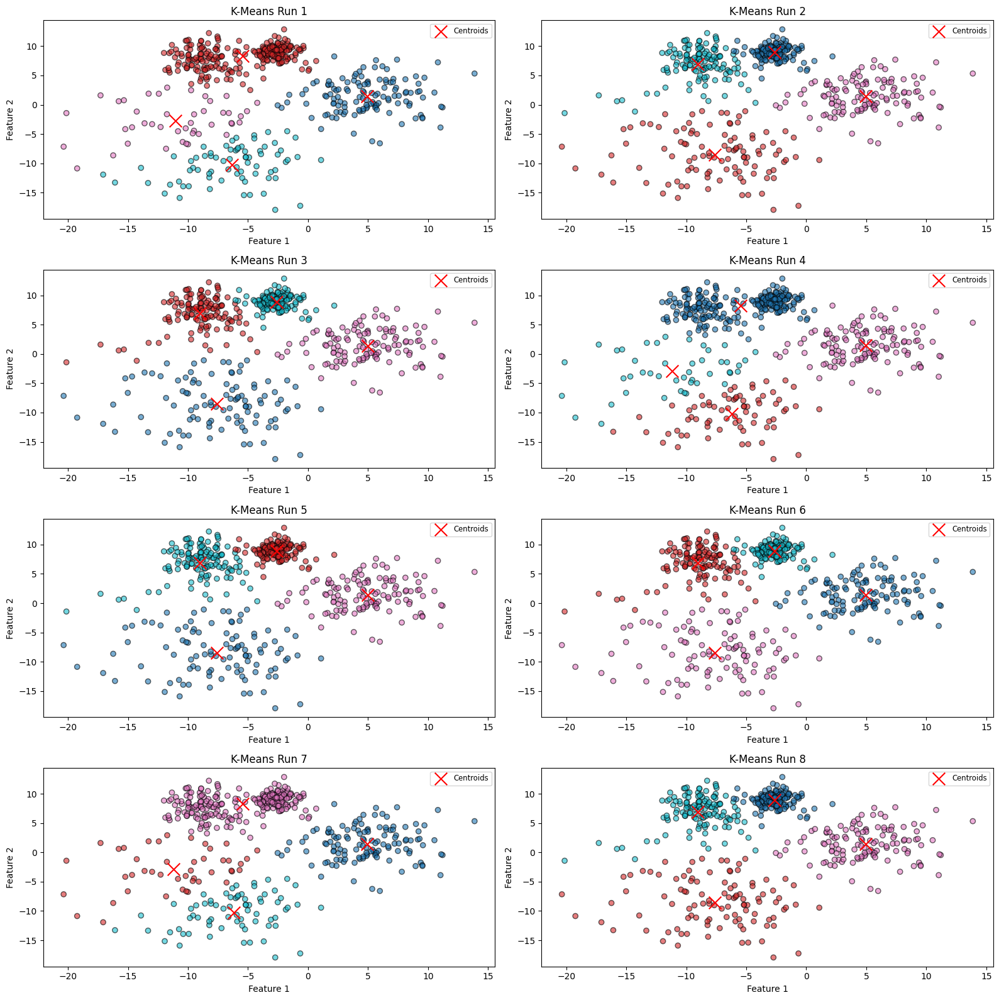

Run 1: Inertia= 8557.67
Run 2: Inertia= 7633.51
Run 3: Inertia= 7633.51
Run 4: Inertia= 8556.71
Run 5: Inertia= 7633.51
Run 6: Inertia= 7633.51
Run 7: Inertia= 8556.71
Run 8: Inertia= 7633.51


In [ ]:
n_runs = 8
inertia_values = []
n_cols = 2
n_rows = -(-n_runs//n_cols)
plt.figure(figsize=(16,16))

for i in range(n_runs):
  kmeans=KMeans(n_clusters=4,random_state=None)
  kmeans.fit(X)
  inertia_values.append(kmeans.inertia_)

  plt.subplot(n_rows,n_cols,i+1)
  plt.scatter(X[:,0],X[:,1],c=kmeans.labels_,cmap="tab10",alpha=0.6,edgecolor='k')
  plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],c='red',s=200,marker='x',label='Centroids')
  plt.title(f'K-Means Run {i + 1}')
  plt.xlabel('Feature 1')
  plt.ylabel('Feature 2')
  plt.legend(loc='upper right', fontsize='small')

plt.tight_layout()
plt.show()

for i, inertia in enumerate(inertia_values,start=1):
  print(f"Run {i}: Inertia= {inertia:.2f}")

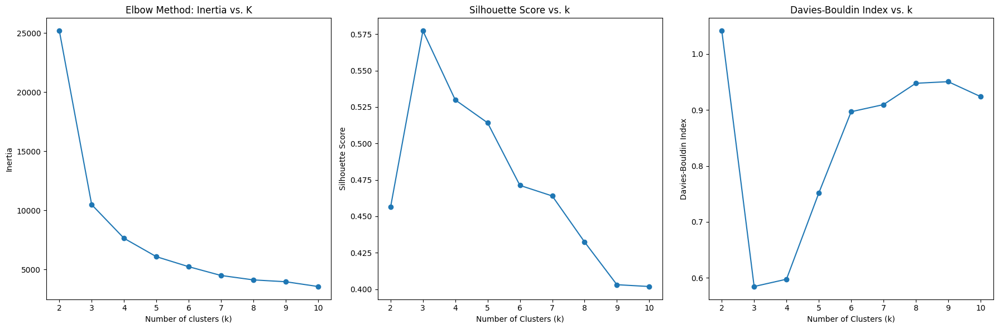

In [ ]:
k_values =range(2,11)

inertia_values =[]
silhouette_scores = []
davies_bouldin_indices = []

for k in k_values:
  kmeans=KMeans(n_clusters=k,random_state=42)
  y_kmeans=kmeans.fit_predict(X)
  inertia_values.append(kmeans.inertia_)
  silhouette_scores.append(silhouette_score(X,y_kmeans))
  davies_bouldin_indices.append(davies_bouldin_score(X,y_kmeans))

plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
plt.plot(k_values,inertia_values,marker='o')
plt.title("Elbow Method: Inertia vs. K")
plt.xlabel("Number of clusters (k)")
plt.ylabel("Inertia")

plt.subplot(1,3,2)
plt.plot(k_values,silhouette_scores,marker='o')
plt.title('Silhouette Score vs. k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')

plt.subplot(1,3,3)
plt.plot(k_values,davies_bouldin_indices,marker='o')
plt.title('Davies-Bouldin Index vs. k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Davies-Bouldin Index')

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

plt.figure(figsize=(18,12))
colormap = cm.tab10

for i, k in enumerate([2,3,4]):
  kmeans= KMeans(n_clusters=k,random_state=42)
  y_kmeans= kmeans.fit_predict(X)
  colors= colormap(y_kmeans.astype(float)/k)
  ax1 =plt.subplot(2,3,i+1)
  ax1.scatter(X[:,0],X[:,1],c=colors,s=50,alpha=0.6,edgecolor='k')
  ax1.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],c='red',s=200,marker='X',label='Centroids')
  centers=kmeans.cluster_centers_

  ax1.scatter(centers[:,0],centers[:,1],marker='o',c='white',alpha=1,s=200,edgecolor='k')

  for idx, c in enumerate(centers):
    ax1.scatter(c[0],c[1],marker=f"${idx}$",alpha=1,s=50,edgecolor='k')

  ax1.set_title(f'K-Means Clustering Results, k={k}')
  ax1.set_xlabel('Feature 1')
  ax1.set_ylabel('Feature 2')
  ax1.legend()

  ax2 = plt.subplot(2,3,i+4)
  evaluate_clustering(X,y_kmeans,k,ax=ax2,title_suffix=f'k={k}')

plt.tight_layout()
plt.show()



/tmp/ipython-input-181367086.py:31: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


In [ ]:
X, y_true = make_classification(n_samples=300,n_features=2,n_informative=2,n_redundant=0,
                                n_clusters_per_class=1,n_classes=3,random_state=42)
kmeans =KMeans(n_clusters=3,random_state=42)
y_kmeans = kmeans.fit_predict(X)
centroids = kmeans.cluster_centers_

vor = Voronoi(centroids)

fig, axes = plt.subplots(2,2,figsize=(14,10))

x_min, x_max = X[:,0].min() -1, X[:,0].max()+1
y_min, y_max = X[:,0].min() -1, X[:,0].max()+1

colormap =cm.tab10
colors_true = colormap(y_true.astype(float)/3)
axes[0,0].scatter(X[:,0],X[:,1],c=colors_true,s=50,alpha=0.5,ec='k')
voronoi_plot_2d(vor,ax=axes[0,0],show_vertices=False,line_colors='red',line_width=2,line_alpha=0.6,point_size=2)
axes[0,0].set_title("Labelled Classification Data with Voronoi Regions")
axes[0,0].set_xlabel("Feature 1")
axes[0,0].set_ylabel("Feature 2")
axes[0,0].set_xlim(x_min,x_max)
axes[0,0].set_ylim(y_min,y_max)

evaluate_clustering(X,y_true,n_clusters=3,ax=axes[1,0],title_suffix='True Labels')

color_kmeans =colormap(y_kmeans.astype(float)/3)
axes[0,1].scatter(X[:,0],X[:,1],c=color_kmeans,s=50,alpha=0.5,ec='k',)
axes[0,1].scatter(centroids[:,0],centroids[:,1],c='red',s=200,marker='X',label='Centroids')
voronoi_plot_2d(vor,ax=axes[0,1],show_vertices=False,line_colors='red',line_width=2,line_alpha=0.6,point_size=2)

axes[0, 1].set_title('K-Means Clustering with Voronoi Regions')
axes[0, 1].set_xlabel('Feature 1')
axes[0, 1].set_ylabel('Feature 2')
axes[0, 1].set_xlim(x_min, x_max)
axes[0, 1].set_ylim(y_min, y_max)

evaluate_clustering(X,y_kmeans,n_clusters=3,ax=axes[1,1],title_suffix="K-means Clustering")

plt.tight_layout()
plt.show()


/tmp/ipython-input-3186197507.py:39: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


In [ ]:
# Generate synthetic classification data
X, y_true = make_classification(n_samples=300, n_features=2, n_informative=2, n_redundant=0,
                                n_clusters_per_class=1, n_classes=3, random_state=42)

# Apply K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
y_kmeans = kmeans.fit_predict(X)
centroids = kmeans.cluster_centers_

# Compute the Voronoi diagram
vor = Voronoi(centroids)

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Get consistent axis limits for all scatter plots
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1

# Plot the true labels with Voronoi regions
colormap = cm.tab10
colors_true = colormap(y_true.astype(float) / 3)
axes[0, 0].scatter(X[:, 0], X[:, 1], c=colors_true, s=50, alpha=0.5, ec='k')
voronoi_plot_2d(vor, ax=axes[0, 0], show_vertices=False, line_colors='red', line_width=2, line_alpha=0.6, point_size=2)
axes[0, 0].set_title('Labelled Classification Data with Voronoi Regions')
axes[0, 0].set_xlabel('Feature 1')
axes[0, 0].set_ylabel('Feature 2')
axes[0, 0].set_xlim(x_min, x_max)
axes[0, 0].set_ylim(y_min, y_max)

# Call evaluate_clustering for true labels
evaluate_clustering(X, y_true, n_clusters=3, ax=axes[1, 0], title_suffix=' True Labels')

# Plot K-Means clustering results with Voronoi regions
colors_kmeans = colormap(y_kmeans.astype(float) / 3)
axes[0, 1].scatter(X[:, 0], X[:, 1], c=colors_kmeans, s=50, alpha=0.5, ec='k')
axes[0, 1].scatter(centroids[:, 0], centroids[:, 1], c='red', s=200, marker='x', label='Centroids')
voronoi_plot_2d(vor, ax=axes[0, 1], show_vertices=False, line_colors='red', line_width=2, line_alpha=0.6, point_size=2)

axes[0, 1].set_title('K-Means Clustering with Voronoi Regions')
axes[0, 1].set_xlabel('Feature 1')
axes[0, 1].set_ylabel('Feature 2')
axes[0, 1].set_xlim(x_min, x_max)
axes[0, 1].set_ylim(y_min, y_max)

# Call evaluate_clustering for K-Means labels
evaluate_clustering(X, y_kmeans, n_clusters=3, ax=axes[1, 1], title_suffix=' K-Means Clustering')

# Adjust layout and show plot
plt.tight_layout()
plt.show()


/tmp/ipython-input-3501050177.py:50: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_error, r2_score

In [ ]:
def regression_results(y_true,y_pred,regr_type):
  ev=explained_variance_score(y_true,y_pred)
  mae = mean_absolute_error(y_true,y_pred)
  mse= mean_squared_error(y_true,y_pred)
  r2 = r2_score(y_true,y_pred)

  print("Evaluation metrics for" + regr_type + "Linear Regression")
  print("Explained Variance: ",round(ev,4))
  print("R2 Score: ",round(r2,4))
  print("MAE:" , round(mae,4))
  print("MSE:", round(mse,4))
  print("RMSE: ",round(np.sqrt(mse),4))
  print()


In [ ]:
noise =1
np.random.seed(42)
X = 2* np.random.rand(1000,1)
y = 4+3*X + noise*np.random.randn(1000,1)
y_ideal = 3*X +4
y_outlier = pd.Series(y.reshape(-1).copy())
threshold = 1.5
outlier_indices = np.where(X.flatten()>threshold)[0]
num_outliers = 5
selected_indices = np.random.choice(outlier_indices,num_outliers,replace=False)
y_outlier[selected_indices] += np.random.uniform(50,100,num_outliers)

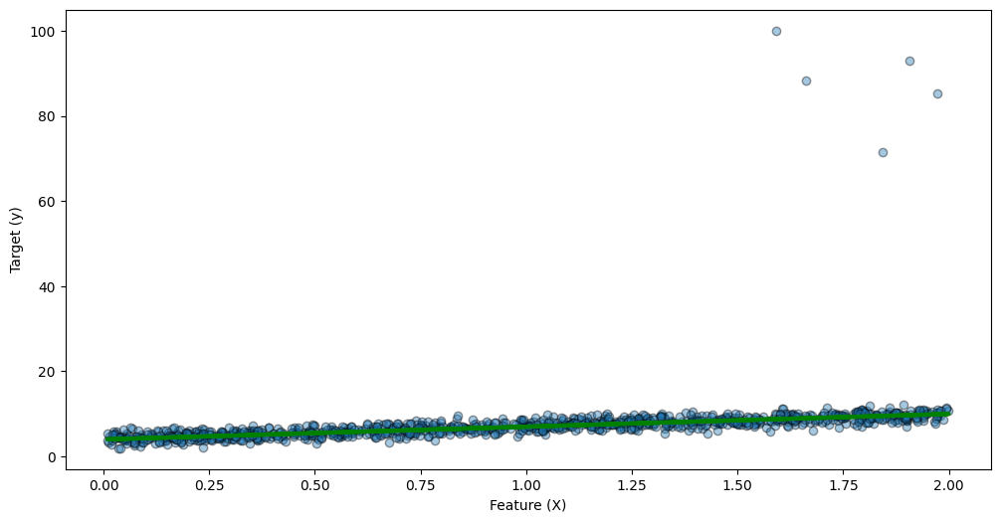

In [ ]:
plt.figure(figsize=(12,6))
plt.scatter(X,y_outlier,alpha=0.4,ec='k',label="Original Data with Outliers")
plt.plot(X,y_ideal,linewidth=3,color='g',label="Ideal Noise Free Data")
plt.xlabel("Feature (X)")
plt.ylabel("Target (y)")
plt.show()

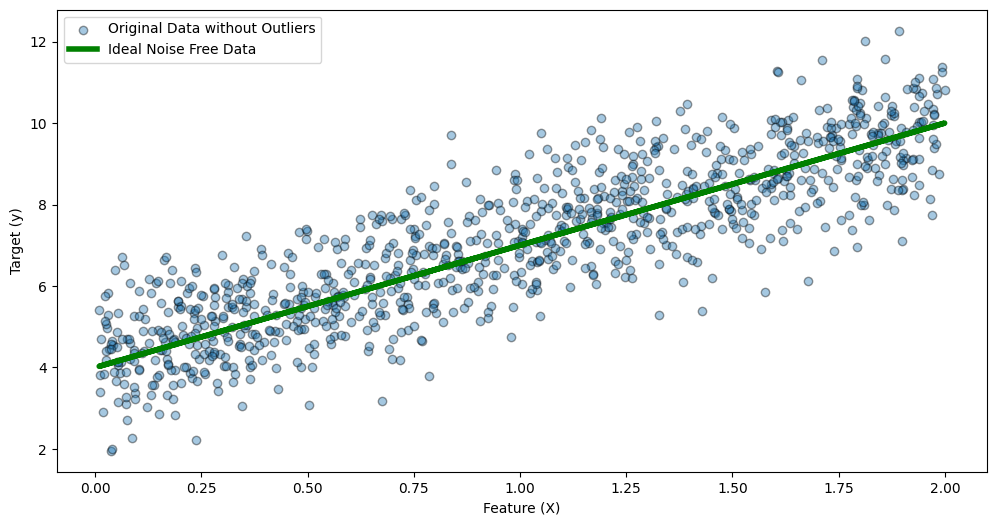

In [ ]:
plt.figure(figsize=(12,6))
plt.scatter(X,y,alpha=0.4,ec='k',label="Original Data without Outliers")
plt.plot(X,y_ideal,linewidth=4,color="g",label="Ideal Noise Free Data")
plt.xlabel("Feature (X)")
plt.ylabel("Target (y)")
plt.legend()
plt.show()

In [ ]:
lin_reg = LinearRegression()
lin_reg.fit(X,y_outlier)
y_outlier_pred_lin = lin_reg.predict(X)

ridge_reg = Ridge(alpha=1)
ridge_reg.fit(X,y_outlier)
y_outlier_pred_ridge = ridge_reg.predict(X)

lasso_reg = Lasso(alpha=.2)
lasso_reg.fit(X,y_outlier)
y_outlier_pred_lasso = lasso_reg.predict(X)

In [ ]:
regression_results(y,y_outlier_pred_lin,"Ordinary")
regression_results(y,y_outlier_pred_ridge,"Ridge")
regression_results(y,y_outlier_pred_lasso,"Lasso")

Evaluation metrics forOrdinaryLinear Regression
Explained Variance:  0.6748
R2 Score:  0.6357
MAE: 0.9468
MSE: 1.4164
RMSE:  1.1901

Evaluation metrics forRidgeLinear Regression
Explained Variance:  0.6766
R2 Score:  0.6375
MAE: 0.9443
MSE: 1.4094
RMSE:  1.1872

Evaluation metrics forLassoLinear Regression
Explained Variance:  0.7394
R2 Score:  0.7003
MAE: 0.8597
MSE: 1.1651
RMSE:  1.0794



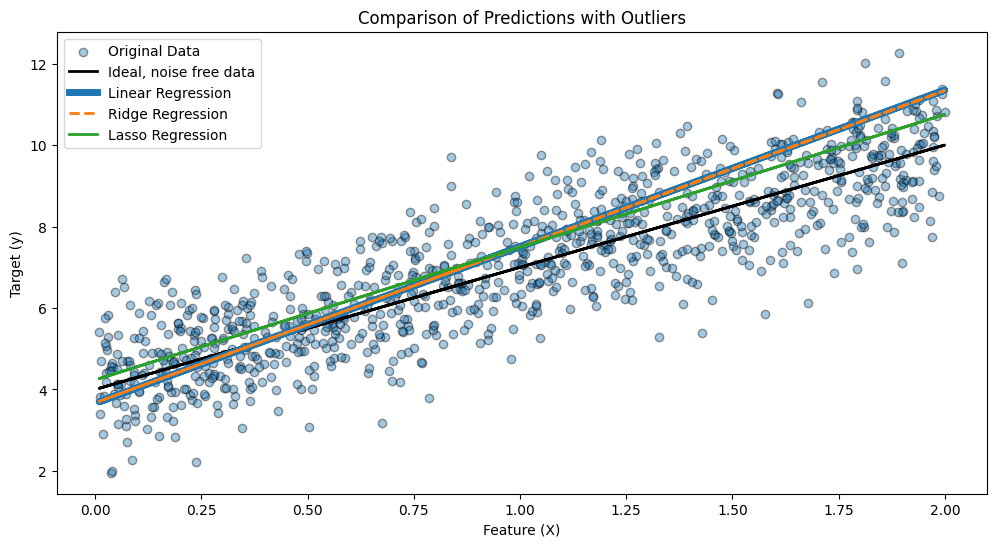

In [ ]:
plt.figure(figsize=(12, 6))

# Scatter plot of the original data with outliers
plt.scatter(X, y, alpha=0.4,ec='k', label='Original Data')

# Plot the ideal regression line (noise free data)
plt.plot(X, y_ideal,  linewidth=2, color='k',label='Ideal, noise free data')

# Plot predictions from the simple linear regression model
plt.plot(X, y_outlier_pred_lin,  linewidth=5, label='Linear Regression')

# Plot predictions from the ridge regression model
plt.plot(X, y_outlier_pred_ridge, linestyle='--', linewidth=2, label='Ridge Regression')

# Plot predictions from the lasso regression model
plt.plot(X, y_outlier_pred_lasso,  linewidth=2, label='Lasso Regression')

plt.xlabel('Feature (X)')
plt.ylabel('Target (y)')
plt.title('Comparison of Predictions with Outliers')
plt.legend()
plt.show()

In [ ]:
lin_reg = LinearRegression()
lin_reg.fit(X,y)
y_pred_lin = lin_reg.predict(X)

ridge_reg = Ridge(alpha=1)
ridge_reg.fit(X,y)
y_pred_ridge = ridge_reg.predict(X)

lasso_reg = Lasso(alpha=.2)
lasso_reg.fit(X,y)
y_pred_lasso = lasso_reg.predict(X)

regression_results(y,y_pred_lin,"Ordinary")
regression_results(y,y_pred_ridge,"Ridge")
regression_results(y,y_pred_lasso,"LAsso")

Evaluation metrics forOrdinaryLinear Regression
Explained Variance:  0.7492
R2 Score:  0.7492
MAE: 0.7873
MSE: 0.975
RMSE:  0.9874

Evaluation metrics forRidgeLinear Regression
Explained Variance:  0.7492
R2 Score:  0.7492
MAE: 0.7874
MSE: 0.975
RMSE:  0.9874

Evaluation metrics forLAssoLinear Regression
Explained Variance:  0.7191
R2 Score:  0.7191
MAE: 0.8408
MSE: 1.0923
RMSE:  1.0451



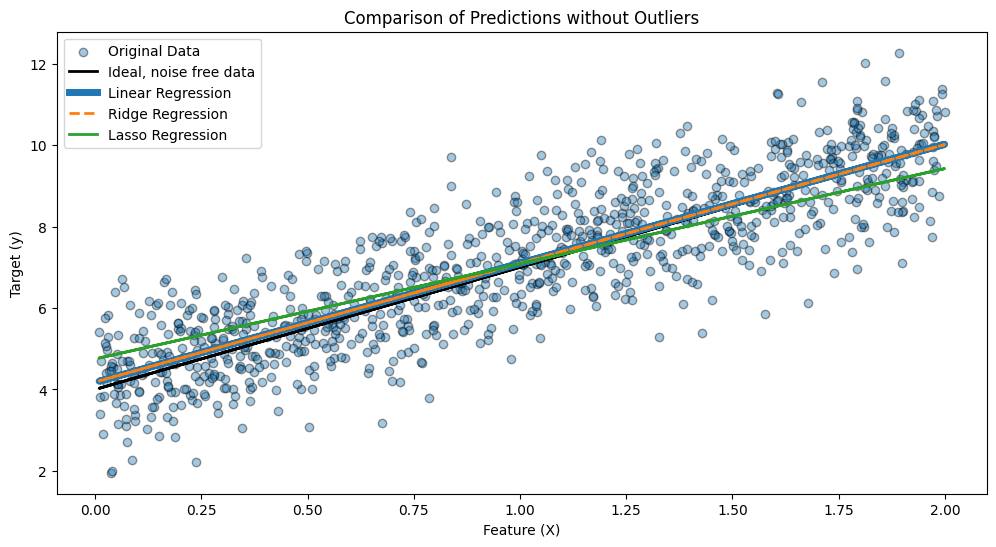

In [ ]:
plt.figure(figsize=(12,6))
plt.scatter(X,y,alpha=0.4,ec='k',label="Original Data")
plt.plot(X,y_ideal, linewidth=2, color='k',label='Ideal, noise free data')
plt.plot(X,y_pred_lin,linewidth=5, label='Linear Regression')
plt.plot(X,y_pred_ridge,linestyle='--',linewidth=2, label='Ridge Regression')
plt.plot(X,y_pred_lasso,linewidth=2, label='Lasso Regression')


plt.xlabel("Feature (X)")
plt.ylabel("Target (y)")
plt.title("Comparison of Predictions without Outliers")

plt.legend()
plt.show()


In [ ]:
from sklearn.datasets import make_regression
X,y, ideal_coef =make_regression(n_samples=100,n_features=100,n_informative=10,noise=10,coef=True)
ideal_predictions = X @ ideal_coef
X_train,X_test,y_train,y_test,ideal_train,ideal_test = train_test_split(X,y,ideal_predictions,test_size=0.3,random_state=+2)
lasso = Lasso(alpha=0.1)
ridge =Ridge(alpha=1.0)
linear= LinearRegression()

lasso.fit(X_train,y_train)
ridge.fit(X_train,y_train)
linear.fit(X_train,y_train)

y_pred_linear = linear.predict(X_test)
y_pred_lasso = lasso.predict(X_test)
y_pred_ridge = ridge.predict(X_test)


In [ ]:
regression_results(y_test,y_pred_linear,"Ordinary")
regression_results(y_test,y_pred_lasso,"Lasso")
regression_results(y_test,y_pred_ridge,"Ridge")

Evaluation metrics forOrdinaryLinear Regression
Explained Variance:  0.6971
R2 Score:  0.6761
MAE: 87.7474
MSE: 12827.8285
RMSE:  113.26

Evaluation metrics forLassoLinear Regression
Explained Variance:  0.9881
R2 Score:  0.9881
MAE: 17.2517
MSE: 470.4955
RMSE:  21.6909

Evaluation metrics forRidgeLinear Regression
Explained Variance:  0.6902
R2 Score:  0.6705
MAE: 89.6305
MSE: 13050.0471
RMSE:  114.2368



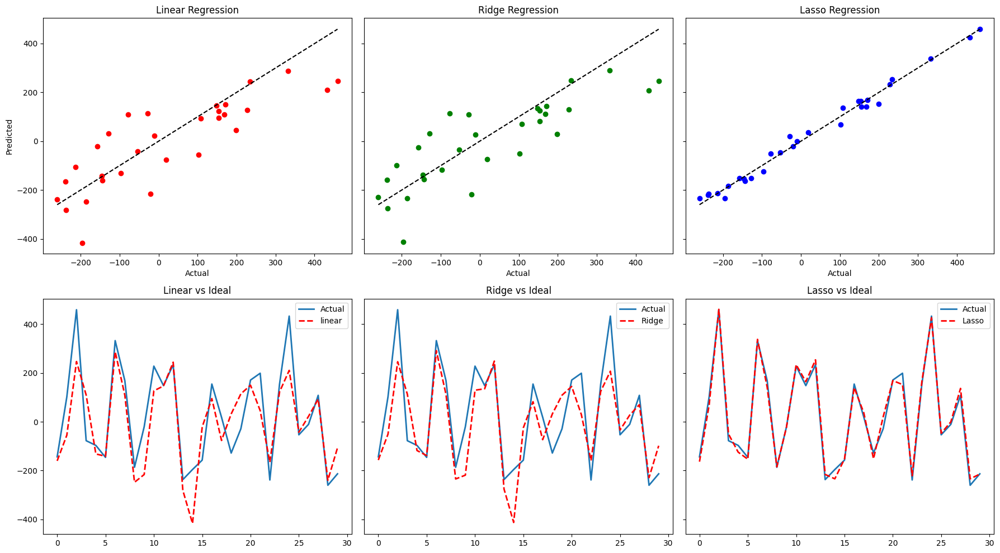

In [ ]:
fig, axes = plt.subplots(2,3,figsize=(18,10),sharey=True)

axes[0,0].scatter(y_test,y_pred_linear, color="red", label="Linear")
axes[0,0].plot([y_test.min(),y_test.max()],[y_test.min(),y_test.max()],'k--')
axes[0,0].set_title("Linear Regression")
axes[0,0].set_xlabel("Actual")
axes[0,0].set_ylabel("Predicted")

axes[0,1].scatter(y_test,y_pred_ridge,color="green", label="Ridge")
axes[0,1].plot([y_test.min(),y_test.max()],[y_test.min(),y_test.max()],'k--')
axes[0,1].set_title("Ridge Regression")
axes[0,1].set_xlabel("Actual")

axes[0,2].scatter(y_test,y_pred_lasso,color="blue",label='lasso')
axes[0,2].plot([y_test.min(),y_test.max()],[y_test.min(),y_test.max()],'k--')
axes[0,2].set_title("Lasso Regression")
axes[0,2].set_xlabel("Actual")


axes[1,0].plot(y_test,label='Actual',lw=2)
axes[1,0].plot(y_pred_linear,'--',lw=2,color='red',label='linear')
axes[1,0].set_title("Linear vs Ideal",)
axes[1,0].legend()

axes[1,1].plot(y_test,label='Actual',lw=2)
axes[1,1].plot(y_pred_ridge,'--',lw=2,color='red',label='Ridge')
axes[1,1].set_title("Ridge vs Ideal",)
axes[1,1].legend()

axes[1,2].plot(y_test,label='Actual',lw=2)
axes[1,2].plot(y_pred_lasso,'--',lw=2,color='red',label='Lasso')
axes[1,2].set_title("Lasso vs Ideal",)
axes[1,2].legend()

plt.tight_layout()
plt.show()

In [ ]:
ridge_coeff = ridge_reg.coef_
linear_coeff = linear.coef_
lasso_coeff = lasso_reg.coef_


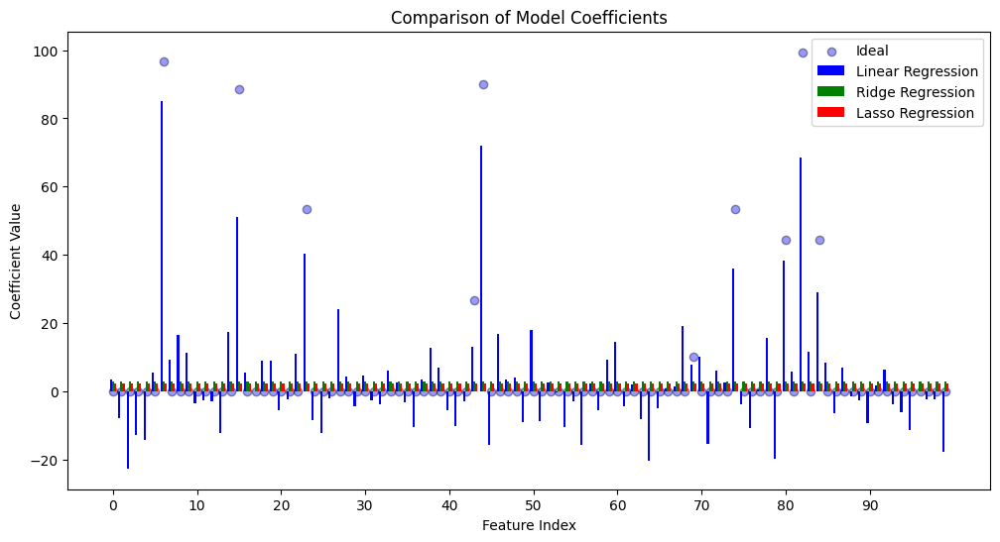

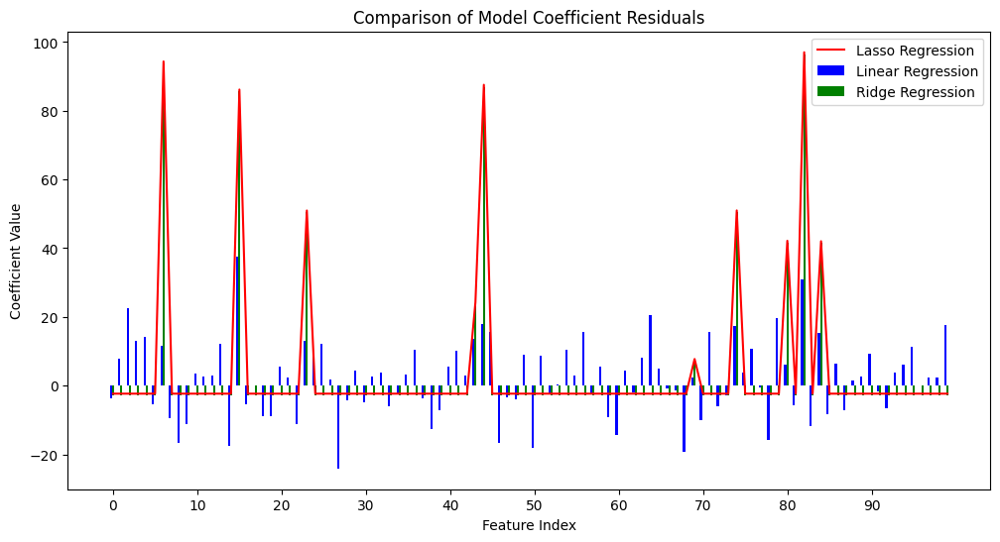

In [ ]:
# Plot the coefficients
x_axis = np.arange(len(linear_coeff))
x_labels = np.arange(min(x_axis),max(x_axis),10)
plt.figure(figsize=(12, 6))

plt.scatter(x_axis, ideal_coef,  label='Ideal', color='blue', ec='k', alpha=0.4)
plt.bar(x_axis - 0.25, linear_coeff, width=0.25, label='Linear Regression', color='blue')
plt.bar(x_axis, ridge_coeff, width=0.25, label='Ridge Regression', color='green')
plt.bar(x_axis + 0.25, lasso_coeff, width=0.25, label='Lasso Regression', color='red')

plt.xlabel('Feature Index')
plt.ylabel('Coefficient Value')
plt.title('Comparison of Model Coefficients')
plt.xticks(x_labels)
plt.legend()
plt.show()


# Plot the coefficient residuals
x_axis = np.arange(len(linear_coeff))

plt.figure(figsize=(12, 6))

plt.bar(x_axis - 0.25, ideal_coef - linear_coeff, width=0.25, label='Linear Regression', color='blue')
plt.bar(x_axis, ideal_coef - ridge_coeff, width=0.25, label='Ridge Regression', color='green')
# plt.bar(x_axis + 0.25, ideal_coef - lasso_coeff, width=0.25, label='Lasso Regression', color='red')
plt.plot(x_axis, ideal_coef - lasso_coeff, label='Lasso Regression', color='red')

plt.xlabel('Feature Index')
plt.ylabel('Coefficient Value')
plt.title('Comparison of Model Coefficient Residuals')
plt.xticks(x_labels)
plt.legend()
plt.show()

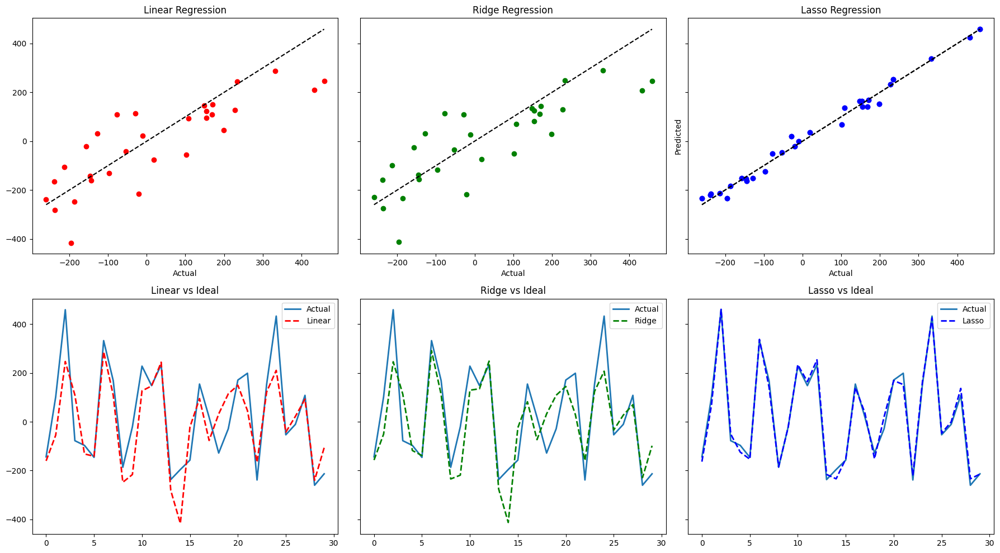

In [ ]:
# Plot the predictions vs actuals
fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharey=True)

axes[0,0].scatter(y_test, y_pred_linear, color="red", label="Linear")
axes[0,0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--')
axes[0,0].set_title("Linear Regression",)
axes[0,0].set_xlabel("Actual",)

axes[0,2].scatter(y_test, y_pred_lasso, color="blue", label="Lasso")
axes[0,2].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--')
axes[0,2].set_title("Lasso Regression",)
axes[0,2].set_xlabel("Actual",)
axes[0,2].set_ylabel("Predicted",)

axes[0,1].scatter(y_test, y_pred_ridge, color="green", label="Ridge")
axes[0,1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--')
axes[0,1].set_title("Ridge Regression",)
axes[0,1].set_xlabel("Actual",)

axes[0,2].scatter(y_test, y_pred_lasso, color="blue", label="Lasso")
axes[0,2].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--')
axes[0,2].set_title("Lasso Regression",)
axes[0,2].set_xlabel("Actual",)
axes[0,2].set_ylabel("Predicted",)

# Line plots for predictions compared to actual and ideal predictions
axes[1,0].plot(y_test, label="Actual", lw=2)
axes[1,0].plot(y_pred_linear, '--', lw=2, color='red', label="Linear")
axes[1,0].set_title("Linear vs Ideal",)
axes[1,0].legend()

axes[1,1].plot(y_test, label="Actual", lw=2)
axes[1,1].plot(y_pred_ridge, '--', lw=2, color='green', label="Ridge")
axes[1,1].set_title("Ridge vs Ideal",)
axes[1,1].legend()

axes[1,2].plot(y_test, label="Actual", lw=2)
axes[1,2].plot(y_pred_lasso, '--', lw=2, color='blue', label="Lasso")
axes[1,2].set_title("Lasso vs Ideal",)
axes[1,2].legend()

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [ ]:
data = load_iris()
X,y = data.data, data.target
labels = data.target_names

In [ ]:
pipeline = Pipeline([
    ('scaler',StandardScaler()),
    ('pca',PCA(n_components=2)),
    ('knn',KNeighborsClassifier(n_neighbors=5))
])

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42,stratify=y)

In [ ]:
pipeline.fit(X_train,y_train)

test_score = pipeline.score(X_test,y_test)
print(f"{test_score:.3f}")

0.900


In [ ]:
y_pred = pipeline.predict(X_test)

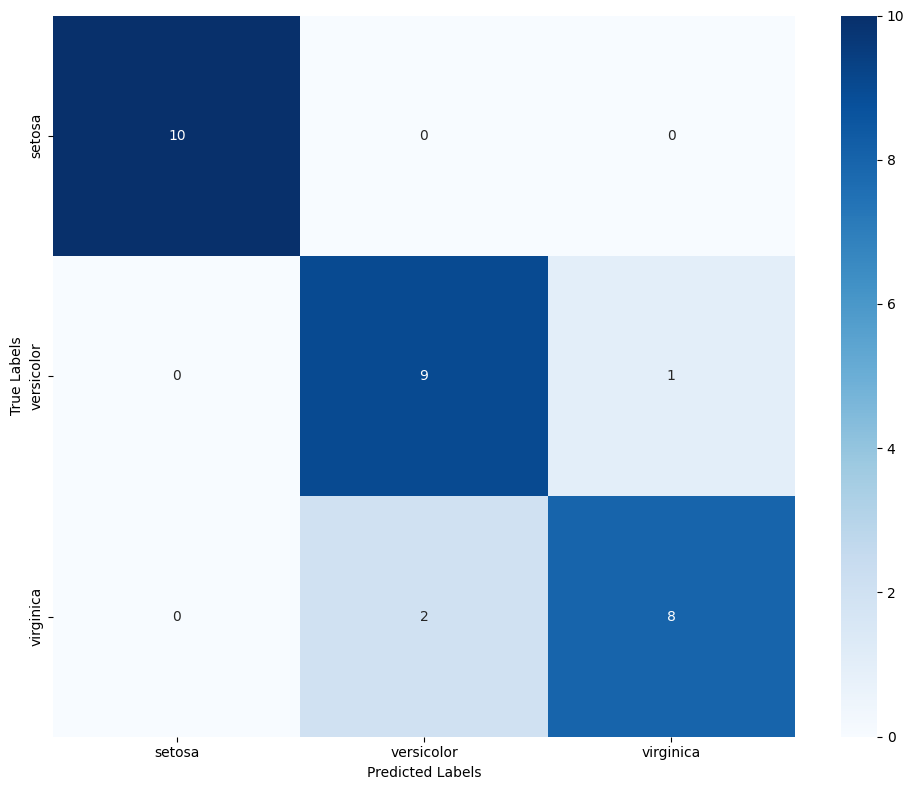

In [ ]:
conf_matrix = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(10,8))
sns.heatmap(conf_matrix,annot =True,cmap='Blues',fmt='d',xticklabels=labels,yticklabels=labels)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.tight_layout()
plt.show()

In [ ]:
pipeline = Pipeline([
    ("scaler",StandardScaler()),
    ("pca",PCA()),
    ("knn",KNeighborsClassifier())
]
)

param_grid={'pca__n_components':[2,3],
            'knn__n_neighbors':[3,5,7]}

In [ ]:
cv = StratifiedKFold(n_splits=5,shuffle=True,random_state=42)

In [ ]:
best_model= GridSearchCV(estimator=pipeline,param_grid=param_grid,cv=cv,scoring='accuracy',verbose=2)

In [ ]:
best_model.fit(X_train,y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END ............knn__n_neighbors=3, pca__n_components=2; total time=   0.0s
[CV] END ............knn__n_neighbors=3, pca__n_components=2; total time=   0.0s
[CV] END ............knn__n_neighbors=3, pca__n_components=2; total time=   0.0s
[CV] END ............knn__n_neighbors=3, pca__n_components=2; total time=   0.0s
[CV] END ............knn__n_neighbors=3, pca__n_components=2; total time=   0.0s
[CV] END ............knn__n_neighbors=3, pca__n_components=3; total time=   0.0s
[CV] END ............knn__n_neighbors=3, pca__n_components=3; total time=   0.0s
[CV] END ............knn__n_neighbors=3, pca__n_components=3; total time=   0.0s
[CV] END ............knn__n_neighbors=3, pca__n_components=3; total time=   0.0s
[CV] END ............knn__n_neighbors=3, pca__n_components=3; total time=   0.0s
[CV] END ............knn__n_neighbors=5, pca__n_components=2; total time=   0.0s
[CV] END ............knn__n_neighbors=5, pca__n_c

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA()),
                                       ('knn', KNeighborsClassifier())]),
             param_grid={'knn__n_neighbors': [3, 5, 7],
                         'pca__n_components': [2, 3]},
             scoring='accuracy', verbose=2)

In [ ]:
test_score =best_model.score(X_test,y_test)
print(f"{test_score:.3f}")


0.933


In [ ]:
best_model.best_params_

{'knn__n_neighbors': 3, 'pca__n_components': 3}

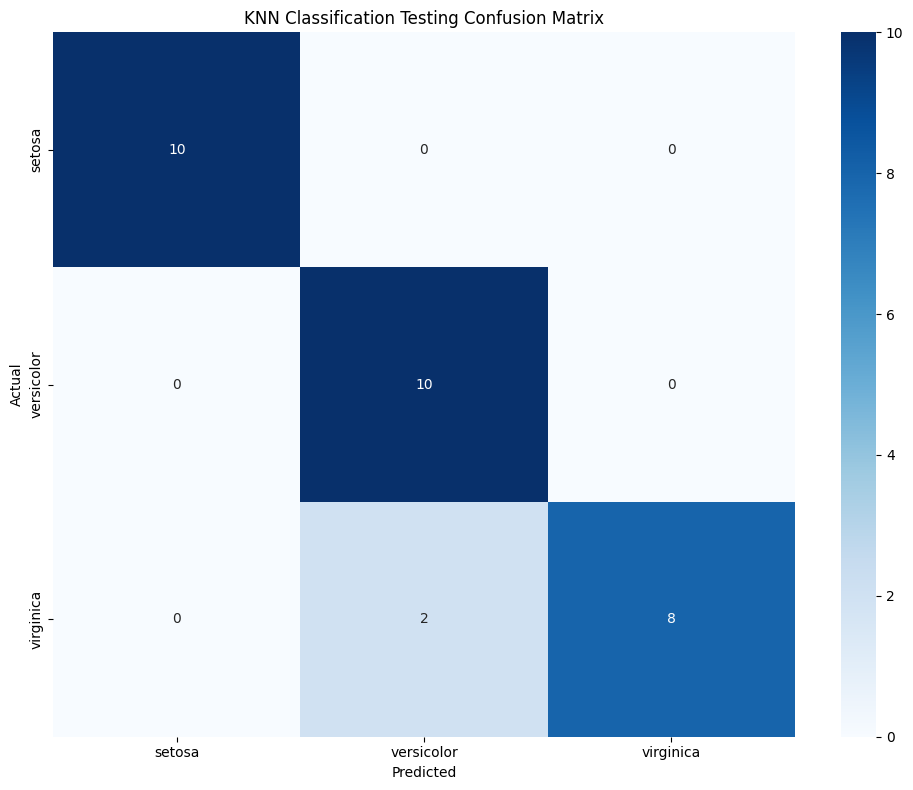

In [ ]:
y_pred = best_model.predict(X_test)

conf_matrix = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(10,8))
sns.heatmap(conf_matrix,annot=True,cmap='Blues',fmt='d',xticklabels=labels,yticklabels=labels)
plt.title('KNN Classification Testing Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
import seaborn as sns
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

In [ ]:
titanic = sns.load_dataset("titanic")
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


In [ ]:
titanic.describe()

,survived,pclass,age,sibsp,parch,fare
count,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [ ]:
titanic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   survived     891 non-null    int64   
 1   pclass       891 non-null    int64   
 2   sex          891 non-null    object  
 3   age          714 non-null    float64 
 4   sibsp        891 non-null    int64   
 5   parch        891 non-null    int64   
 6   fare         891 non-null    float64 
 7   embarked     889 non-null    object  
 8   class        891 non-null    category
 9   who          891 non-null    object  
 10  adult_male   891 non-null    bool    
 11  deck         203 non-null    category
 12  embark_town  889 non-null    object  
 13  alive        891 non-null    object  
 14  alone        891 non-null    bool    
dtypes: bool(2), category(2), float64(2), int64(4), object(5)
memory usage: 80.7+ KB


In [ ]:
features = ['pclass', 'sex', 'age', 'sibsp', 'parch', 'fare', 'class', 'who', 'adult_male', 'alone']
target = "survived"

X = titanic[features]
y = titanic[target]

In [ ]:
y.value_counts()

,count
survived,
0,549
1,342


In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42,stratify=y)

In [ ]:
numerical_features = X_train.select_dtypes(include= ['number']).columns.tolist()
categorical_features = X_train.select_dtypes(include=['object','category']).columns.tolist()


In [ ]:
numerical_transformer = Pipeline(steps=[
    ('imputer',SimpleImputer(strategy='median')),
    ('scaler',StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ("imputer",SimpleImputer(strategy='most_frequent')),
    ("onehot",OneHotEncoder(handle_unknown='ignore'))
])

In [ ]:
preprocesser = ColumnTransformer(transformers=[
    ("num",numerical_transformer,numerical_features),
    ("cat",categorical_transformer,categorical_features)
])

In [ ]:
pipeline =Pipeline(steps=[
    ("preprocessor",preprocesser),
    ("classifier",RandomForestClassifier(random_state=42))
])

In [ ]:
param_grid = {
    "classifier__n_estimators":[50,100],
    "classifier__max_depth":[None,10,20],
    "classifier__min_samples_split":[2,5]
}

In [ ]:
cv = StratifiedKFold(n_splits=5,shuffle=True)

In [ ]:
model = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=cv, scoring='accuracy', verbose=2)
model.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=50; total time=   0.9s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=50; total time=   0.8s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=50; total time=   0.6s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=50; total time=   0.4s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=50; total time=   0.5s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=100; total time=   0.7s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=100; total time=   0.8s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=100; total time=

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=True),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['pclass',
                                                                          'age',
                                                                          'sibsp',
                                                                          'parch',
                                                                          'fare']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['sex',
                                                                          'class',
                                                                          'who'])])),
                                       ('classifier',
                                        RandomForestClassifier(random_state=42))]),
             param_grid={'classifier__max_depth': [None, 10, 20],
                         'classifier__min_samples_split': [2, 5],
                         'classifier__n_estimators': [50, 100]},
             scoring='accuracy', verbose=2)

In [ ]:
y_pred =model.predict(X_test)
model_score = model.score(X_test,y_test)
print(model_score)
print(classification_report(y_test,y_pred))

0.8324022346368715
              precision    recall  f1-score   support

           0       0.84      0.89      0.87       110
           1       0.81      0.74      0.77        69

    accuracy                           0.83       179
   macro avg       0.83      0.82      0.82       179
weighted avg       0.83      0.83      0.83       179



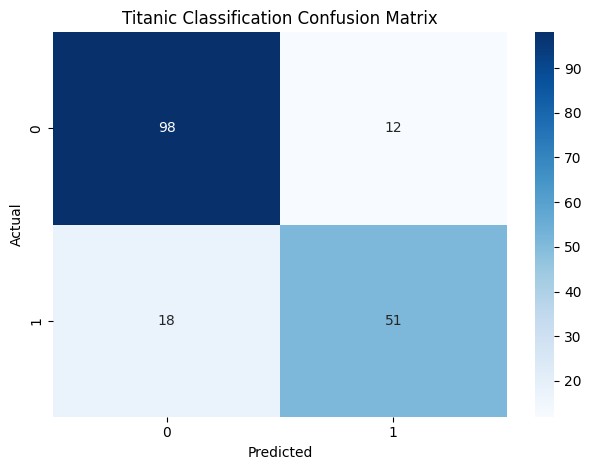

In [ ]:
conf_matrix = confusion_matrix(y_test,y_pred)
sns.heatmap(conf_matrix,annot=True,cmap='Blues',fmt='d')
plt.title("Titanic Classification Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

In [ ]:
model.best_estimator_["preprocessor"].named_transformers_["cat"].named_steps['onehot'].get_feature_names_out(categorical_features)

array(['sex_female', 'sex_male', 'class_First', 'class_Second',
       'class_Third', 'who_child', 'who_man', 'who_woman'], dtype=object)

In [ ]:
feature_importances = model.best_estimator_['classifier'].feature_importances_

# Combine the numerical and one-hot encoded categorical feature names
feature_names = numerical_features + list(model.best_estimator_['preprocessor']
                                        .named_transformers_['cat']
                                        .named_steps['onehot']
                                        .get_feature_names_out(categorical_features))

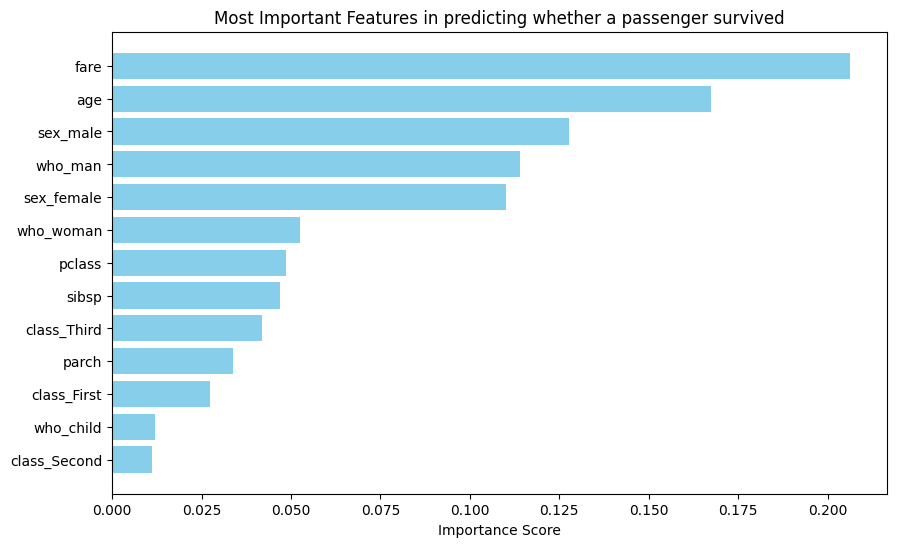

0.8324022346368715


In [ ]:
importance_df = pd.DataFrame({'feature': feature_names,
                              'Importance':feature_importances}).sort_values(by='Importance',ascending=False)

plt.figure(figsize=(10,6))
plt.barh(importance_df["feature"],importance_df["Importance"],color='skyblue')
plt.gca().invert_yaxis()
plt.title('Most Important Features in predicting whether a passenger survived')
plt.xlabel('Importance Score')
plt.show()

test_score = model.score(X_test,y_test)
print(test_score)

In [ ]:
pipeline.set_params(classifier=LogisticRegression(random_state=42))
model.estimator=pipeline
param_grid = {
    'classifier__solver':['liblinear'],
    'classifier__penalty':['l1','l2'],
    'classifier__class_weight': [None,'balanced']

}
model.param_grid  =param_grid
model.fit(X_train,y_train)
y_pred = model.predict(X_test)


Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END classifier__class_weight=None, classifier__penalty=l1, classifier__solver=liblinear; total time=   0.1s
[CV] END classifier__class_weight=None, classifier__penalty=l1, classifier__solver=liblinear; total time=   0.1s
[CV] END classifier__class_weight=None, classifier__penalty=l1, classifier__solver=liblinear; total time=   0.0s
[CV] END classifier__class_weight=None, classifier__penalty=l1, classifier__solver=liblinear; total time=   0.0s
[CV] END classifier__class_weight=None, classifier__penalty=l1, classifier__solver=liblinear; total time=   0.1s
[CV] END classifier__class_weight=None, classifier__penalty=l2, classifier__solver=liblinear; total time=   0.1s
[CV] END classifier__class_weight=None, classifier__penalty=l2, classifier__solver=liblinear; total time=   0.0s
[CV] END classifier__class_weight=None, classifier__penalty=l2, classifier__solver=liblinear; total time=   0.0s
[CV] END classifier__class_weight=No

In [ ]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.84      0.89      0.86       110
           1       0.81      0.72      0.76        69

    accuracy                           0.83       179
   macro avg       0.82      0.81      0.81       179
weighted avg       0.83      0.83      0.82       179



In [ ]:
print(model.score(X_test,y_test))

0.8268156424581006


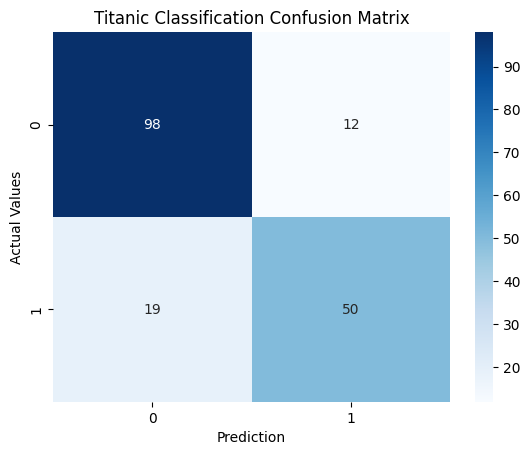

In [ ]:
conf_matrix = confusion_matrix(y_test,y_pred)
plt.figure()
sns.heatmap(conf_matrix,annot=True,cmap='Blues',fmt='d')
plt.title('Titanic Classification Confusion Matrix')

plt.xlabel("Prediction")
plt.ylabel("Actual Values")

plt.show()

In [ ]:
coefficients = model.best_estimator_.named_steps['classifier'].coef_[0]

numerical_feature_names = numerical_features
categorical_feature_names = (model.best_estimator_.named_steps['preprocessor']
                             .named_transformers_['cat'].named_steps['onehot']
                             .get_feature_names_out(categorical_features))
features_names = numerical_feature_names + list(categorical_feature_names)




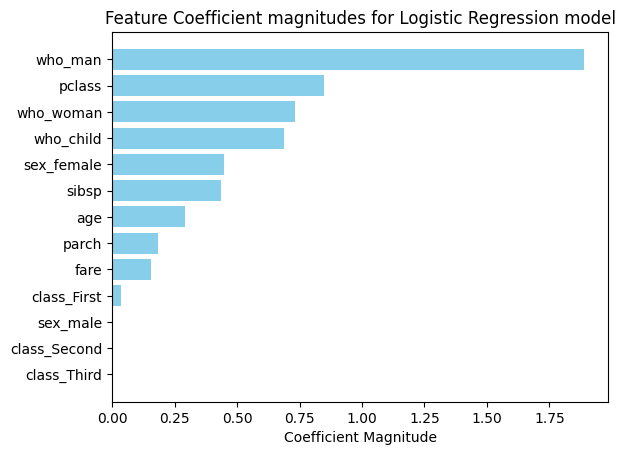


Test set accuracy: 82.68%


In [ ]:
importance_df = pd.DataFrame({'feature':feature_names,
                              'importance':coefficients}).sort_values(by='importance',ascending=False,key=abs)

plt.figure()
plt.barh(importance_df['feature'],importance_df['importance'].abs(),color='skyblue')
plt.gca().invert_yaxis()
plt.title('Feature Coefficient magnitudes for Logistic Regression model')
plt.xlabel('Coefficient Magnitude')
plt.show()

# Print test score
test_score = model.best_estimator_.score(X_test,y_test)
print(f"\nTest set accuracy: {test_score:.2%}")

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns

In [ ]:
url="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/_0eYOqji3unP1tDNKWZMjg/weatherAUS-2.csv"
df = pd.read_csv(url)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [ ]:
df.count()

,0
Date,145460
Location,145460
MinTemp,143975
MaxTemp,144199
Rainfall,142199
Evaporation,82670
Sunshine,75625
WindGustDir,135134
WindGustSpeed,135197
WindDir9am,134894


In [ ]:
df["RainTomorrow"].value_counts()

,count
RainTomorrow,
No,110316
Yes,31877


In [ ]:
# Inbalanced data
# It's a classification problem

In [ ]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [ ]:
df  =df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 56420 entries, 6049 to 142302
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           56420 non-null  object 
 1   Location       56420 non-null  object 
 2   MinTemp        56420 non-null  float64
 3   MaxTemp        56420 non-null  float64
 4   Rainfall       56420 non-null  float64
 5   Evaporation    56420 non-null  float64
 6   Sunshine       56420 non-null  float64
 7   WindGustDir    56420 non-null  object 
 8   WindGustSpeed  56420 non-null  float64
 9   WindDir9am     56420 non-null  object 
 10  WindDir3pm     56420 non-null  object 
 11  WindSpeed9am   56420 non-null  float64
 12  WindSpeed3pm   56420 non-null  float64
 13  Humidity9am    56420 non-null  float64
 14  Humidity3pm    56420 non-null  float64
 15  Pressure9am    56420 non-null  float64
 16  Pressure3pm    56420 non-null  float64
 17  Cloud9am       56420 non-null  float64
 18  Cloud3p

In [ ]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [ ]:
df = df.rename(columns={'RainToday':'RainYesterday',
                        'RainTomorrow':'RainToday'})

In [ ]:
df = df[df.Location.isin(['Melbourne','MelbourneAirport','Watsonia'])]
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7557 entries, 64191 to 80997
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           7557 non-null   object 
 1   Location       7557 non-null   object 
 2   MinTemp        7557 non-null   float64
 3   MaxTemp        7557 non-null   float64
 4   Rainfall       7557 non-null   float64
 5   Evaporation    7557 non-null   float64
 6   Sunshine       7557 non-null   float64
 7   WindGustDir    7557 non-null   object 
 8   WindGustSpeed  7557 non-null   float64
 9   WindDir9am     7557 non-null   object 
 10  WindDir3pm     7557 non-null   object 
 11  WindSpeed9am   7557 non-null   float64
 12  WindSpeed3pm   7557 non-null   float64
 13  Humidity9am    7557 non-null   float64
 14  Humidity3pm    7557 non-null   float64
 15  Pressure9am    7557 non-null   float64
 16  Pressure3pm    7557 non-null   float64
 17  Cloud9am       7557 non-null   float64
 18  Cloud3pm

In [ ]:
def date_to_season(date):
    month = date.month
    if (month == 12) or (month == 1) or (month == 2):
        return 'Summer'
    elif (month == 3) or (month == 4) or (month == 5):
        return 'Autumn'
    elif (month == 6) or (month == 7) or (month == 8):
        return 'Winter'
    elif (month == 9) or (month == 10) or (month == 11):
        return 'Spring'

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])
df['Season'] = df['Date'].apply(date_to_season)
df=df.drop(columns='Date')
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainYesterday,RainToday,Season
64191,MelbourneAirport,11.2,19.9,0.0,5.6,8.8,SW,69.0,W,SW,...,37.0,1005.1,1006.4,7.0,7.0,15.9,18.1,No,Yes,Summer
64192,MelbourneAirport,7.8,17.8,1.2,7.2,12.9,SSE,56.0,SW,SSE,...,43.0,1018.0,1019.3,6.0,7.0,12.5,15.8,Yes,No,Summer
64193,MelbourneAirport,6.3,21.1,0.0,6.2,10.5,SSE,31.0,E,S,...,35.0,1020.8,1017.6,1.0,7.0,13.4,19.6,No,No,Summer
64194,MelbourneAirport,8.1,29.2,0.0,6.4,12.5,SSE,35.0,NE,SSE,...,23.0,1016.2,1012.8,5.0,4.0,16.0,28.2,No,No,Summer
64195,MelbourneAirport,9.7,29.0,0.0,7.4,12.3,SE,33.0,SW,SSE,...,31.0,1011.9,1010.3,6.0,2.0,19.4,27.1,No,No,Summer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80992,Watsonia,3.6,14.5,0.0,2.4,8.8,NNE,41.0,ENE,NNE,...,66.0,1028.4,1025.0,1.0,7.0,5.2,13.8,No,No,Winter
80994,Watsonia,4.8,13.3,0.4,0.6,0.0,NNW,24.0,NE,NNE,...,63.0,1028.5,1025.1,7.0,7.0,5.6,12.4,No,No,Winter
80995,Watsonia,5.6,13.1,0.0,1.6,6.0,NNW,52.0,NE,N,...,67.0,1019.0,1014.0,1.0,7.0,8.8,11.6,No,Yes,Winter
80996,Watsonia,6.9,12.1,3.2,1.8,5.6,SSW,24.0,WNW,SW,...,61.0,1018.7,1017.3,2.0,7.0,7.9,11.0,Yes,No,Winter


In [ ]:
df.value_counts("RainToday")

,count
RainToday,
No,5766
Yes,1791


In [ ]:
X = df.drop(columns='RainToday',axis=1)
y= df["RainToday"]

In [ ]:
y.value_counts()

,count
RainToday,
No,5766
Yes,1791


In [ ]:
1791/5766

0.3106139438085328

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
numerical_features = X_train.select_dtypes(include=['number']).columns.tolist()
categorical_features = X_train.select_dtypes(include=['object','category']).columns.tolist()


In [ ]:
categorical_features

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainYesterday',
 'Season']

In [ ]:
numeric_transformer = Pipeline(steps=[
    ("scaler",StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ("onehot",OneHotEncoder(handle_unknown='ignore'))
])



In [ ]:
preprocessor = ColumnTransformer(transformers=[
    ("num",numeric_transformer,numerical_features),
    ("cat",categorical_transformer,categorical_features)
])



In [ ]:
pipeline = Pipeline(steps=[
    ("preprocessor",preprocessor),
    ("classifier",RandomForestClassifier(random_state=42))
])

In [ ]:
param_grid = {
    "classifier__n_estimators":[50,100],
    "classifier__max_depth":[None,10,20],
    "classifier__min_samples_split":[2,5]
    }

In [ ]:
cv = StratifiedKFold(n_splits=5,shuffle=True)

In [ ]:
grid_search = GridSearchCV(pipeline,cv=cv, param_grid=param_grid,scoring='accuracy',verbose=2)
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=50; total time=   0.9s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=50; total time=   0.8s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=50; total time=   0.8s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=50; total time=   0.9s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=50; total time=   0.9s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=100; total time=   1.7s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=100; total time=   1.7s
[CV] END classifier__max_depth=None, classifier__min_samples_split=2, classifier__n_estimators=100; total time=

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=True),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('scaler',
                                                                                          StandardScaler())]),
                                                                         ['MinTemp',
                                                                          'MaxTemp',
                                                                          'Rainfall',
                                                                          'Evaporation',
                                                                          'Sunshine',
                                                                          'WindGustSpeed',
                                                                          'WindSpeed9am',
                                                                          'WindSpeed3pm',
                                                                          'Humidity9am',
                                                                          'Humidity3pm',
                                                                          'Pressure9am',
                                                                          'Pr...
                                                                         Pipeline(steps=[('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['Location',
                                                                          'WindGustDir',
                                                                          'WindDir9am',
                                                                          'WindDir3pm',
                                                                          'RainYesterday',
                                                                          'Season'])])),
                                       ('classifier',
                                        RandomForestClassifier(random_state=42))]),
             param_grid={'classifier__max_depth': [None, 10, 20],
                         'classifier__min_samples_split': [2, 5],
                         'classifier__n_estimators': [50, 100]},
             scoring='accuracy', verbose=2)

In [ ]:
print("\nBest parameters found: ", grid_search.best_params_)
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))


Best parameters found:  {'classifier__max_depth': 20, 'classifier__min_samples_split': 5, 'classifier__n_estimators': 50}
Best cross-validation score: 0.85


In [ ]:
test_score = grid_search.score(X_test, y_test)
print("Test set score: {:.2f}".format(test_score))

Test set score: 0.85


In [ ]:
y_pred = grid_search.predict(X_test)

In [ ]:
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

          No       0.87      0.95      0.90      1154
         Yes       0.76      0.53      0.62       358

    accuracy                           0.85      1512
   macro avg       0.81      0.74      0.76      1512
weighted avg       0.84      0.85      0.84      1512



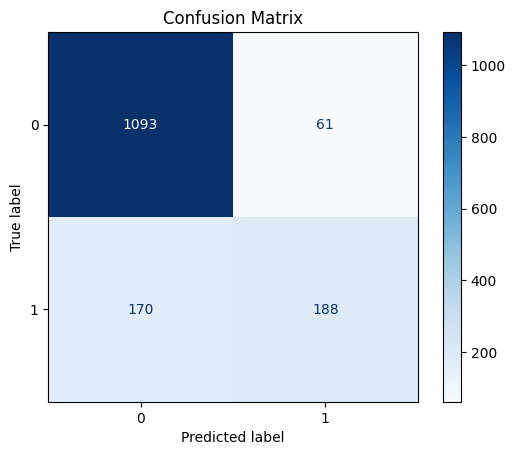

In [ ]:
conf_matrix = confusion_matrix(y_test,y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot(cmap="Blues")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
feature_importances =grid_search.best_estimator_['classifier'].feature_importances_


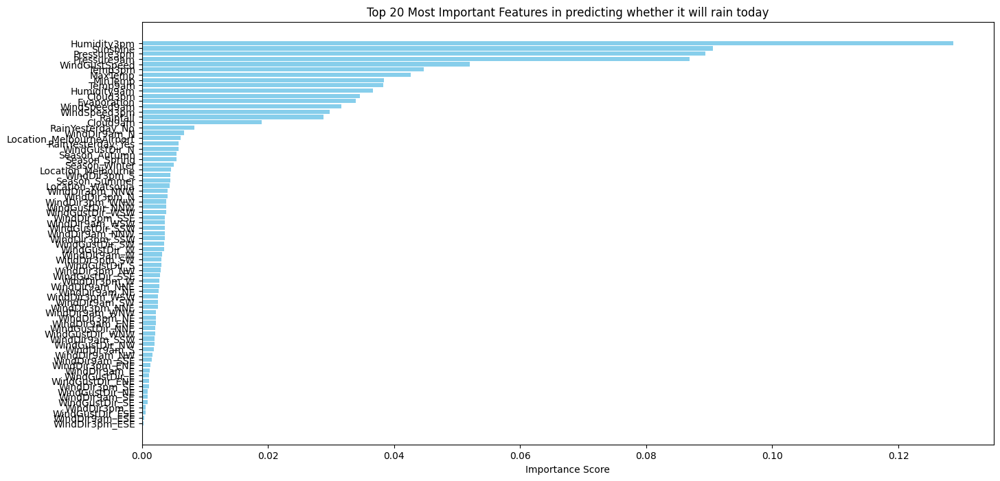

In [ ]:
feature_names = numerical_features + list(grid_search.best_estimator_["preprocessor"]
                                          .named_transformers_["cat"]
                                          .named_steps["onehot"]
                                          .get_feature_names_out(categorical_features))
feature_importances = grid_search.best_estimator_['classifier'].feature_importances_
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance':feature_importances
}).sort_values(by='importance',ascending=False)
N=20
top_features = importance_df.head(N)
plt.figure(figsize=(16,8))
plt.barh(importance_df["feature"],importance_df["importance"],color='skyblue')
plt.gca().invert_yaxis()
plt.title(f'Top {N} Most Important Features in predicting whether it will rain today')
plt.xlabel('Importance Score')
plt.show()


In [ ]:
pipeline.set_params(classifier=LogisticRegression(random_state=42))

# update the model's estimator to use the new pipeline
grid_search.estimator = pipeline

# Define a new grid with Logistic Regression parameters
param_grid = {
    # 'classifier__n_estimators': [50, 100],
    # 'classifier__max_depth': [None, 10, 20],
    # 'classifier__min_samples_split': [2, 5],
    'classifier__solver' : ['liblinear'],
    'classifier__penalty': ['l1', 'l2'],
    'classifier__class_weight' : [None, 'balanced']
}

grid_search.param_grid = param_grid

# Fit the updated pipeline with LogisticRegression
grid_search.fit(X_train,y_train)

# Make predictions
y_pred = grid_search.predict(X_test)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END classifier__class_weight=None, classifier__penalty=l1, classifier__solver=liblinear; total time=   0.3s
[CV] END classifier__class_weight=None, classifier__penalty=l1, classifier__solver=liblinear; total time=   0.2s
[CV] END classifier__class_weight=None, classifier__penalty=l1, classifier__solver=liblinear; total time=   0.1s
[CV] END classifier__class_weight=None, classifier__penalty=l1, classifier__solver=liblinear; total time=   0.2s
[CV] END classifier__class_weight=None, classifier__penalty=l1, classifier__solver=liblinear; total time=   0.1s
[CV] END classifier__class_weight=None, classifier__penalty=l2, classifier__solver=liblinear; total time=   0.1s
[CV] END classifier__class_weight=None, classifier__penalty=l2, classifier__solver=liblinear; total time=   0.1s
[CV] END classifier__class_weight=None, classifier__penalty=l2, classifier__solver=liblinear; total time=   0.1s
[CV] END classifier__class_weight=No

              precision    recall  f1-score   support

          No       0.86      0.93      0.89      1154
         Yes       0.68      0.51      0.58       358

    accuracy                           0.83      1512
   macro avg       0.77      0.72      0.74      1512
weighted avg       0.82      0.83      0.82      1512



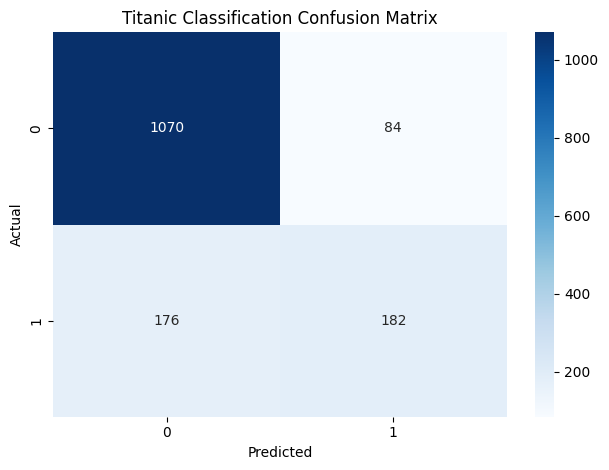

In [ ]:
print(classification_report(y_test, y_pred))

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

plt.figure()
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d')

# Set the title and labels
plt.title('Titanic Classification Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Show the plot
plt.tight_layout()
plt.show()